# CVXpy (Waskiri-Sat)
$$
\renewcommand{\bm}[1]{\boldsymbol{#1}}
$$

The purpose of the following optimal control policy is:
- Perform Waskiri-Sat (1U CubeSat that uses only magnetorquers as torque actuator) inertial attitude maneuvers.
- Optimize the total power required during each maneuver.
- Perform agile maneuvers, minimizing as much as possible the settling time.
- World Magnetic Model (WMM-2025-2030), and orbit propagator generated through a custom Simulink model.

Optimization problem to solve:

$$
	\begin{align*}
		\text{min} \quad &\int_{0}^{t_f}||\bm{m}(t)||_2^2dt+\alpha_m\int_{0}^{t_f}||\dot{\bm{m}}(t)||_2^2dt\\
		\text{s.t.}\quad
		&\dot{\bm{q}}=
		\frac{1}{2}\begin{bmatrix}
			0&-\omega_x&-\omega_y&-\omega_z\\
			\omega_x&0&\omega_z&-\omega_y\\
			\omega_y&-\omega_z&0&\omega_x\\
			\omega_z&\omega_y&-\omega_x&0
		\end{bmatrix}\bm{q}\\
		&\dot{\bm{\omega}}=
		\bm{I}^{-1}(-\bm{\omega}\times\bm{I}\bm{\omega}+(\bm{m}+\bm{m}_{\text{RMM}}(t))\times([B,\text{ECI}]\bm{B}_\text{ECI}(t))\\
		&||\bm{\omega}||_2\leq \omega_{\text{max}}\\
		&||\bm{m}||_\infty\leq m_{\text{max}}\\
		&\bm{q}(0)=\bm{q}_0,\quad\bm{q}(t_f)=\bm{q}_{t_f}\\
		&\bm{w}(0)=\bm{\omega}_0,\quad\bm{\omega}(t_f)=\bm{\omega}_{t_f}
	\end{align*}
$$

In order to optimize computational resources $\bm{h}_{B}=\bm{I}\bm{\omega}$:
$$
	\begin{align*}
		\text{min} \quad &\int_{0}^{t_f}||\bm{m}(t)||_2^2dt+\alpha_m\int_{0}^{t_f}||\dot{\bm{m}}(t)||_2^2dt\\
		\text{s.t.}\quad
		&\dot{\bm{q}}=
		\frac{1}{2}\begin{bmatrix}
			-q_1&-q_2&-q_3\\
			q_0&-q_3&q_2\\
			q_3&q_0&-q_1\\
			-q_2&q_1&q_0
		\end{bmatrix}(\bm{I}^{-1}\bm{h}_B)\\
		&\dot{\bm{h}}_B=
		-(\bm{I}^{-1}\bm{h}_B)\times\bm{h}_B+(\bm{m}+\bm{m}_{\text{RMM}})\times([B,\text{ECI}]\bm{B}_\text{ECI}(t))\\
		&||\bm{I}^{-1}\bm{h}_B||_2\leq \omega_{\text{max}}\\
		&||\bm{m}||_\infty\leq m_{\text{max}}\\
		&\bm{q}(0)=\bm{q}_0,\quad\bm{q}(t_f)=\bm{q}_{t_f}\\
		&\bm{h}_B(0)=\bm{h}_0,\quad\bm{h}_B(t_f)=\bm{h}_{t_f}
	\end{align*}
$$

Given the scaling matrices and vectors $\bm{S}_x$, $\bm{S}_u$, $\bm{c}_x$, $\bm{c}_u$:

$$\hat{\bm{u}}=\begin{bmatrix}
\bm{m}
\end{bmatrix},\quad\hat{\bm{u}}=\bm{S}_u\bm{u}+\bm{c}_u$$

$$\hat{\bm{x}}=\begin{bmatrix}
\bm{q}\\
\bm{\omega}
\end{bmatrix},\quad\hat{\bm{x}}=\bm{S}_x\bm{x}+\bm{c}_x$$

Where scaling matrices and vectors try to limit the optimization variables within $\bm{x}\in[0, 1]^n$, $\bm{u}\in[0, 1]^m$.

First, the original optimization problem is modeled as follows:
$$
\begin{align*}
    \text{min} \quad &J_\lambda(\bm{x},\bm{u},\bm{v}_c,\bm{v}_i)\\
    \text{s.t.}\quad&
        \dot{\hat{\bm{x}}}=
        \bm{f}(\hat{\bm{x}},\hat{\bm{u}},t)\\
    &\bm{g}(\hat{\bm{x}},\hat{\bm{u}},t)\leq \bm{0}\\
    &\hat{\bm{x}}\in\mathcal{X},\quad \hat{\bm{u}}\in\mathcal{U}
\end{align*}
$$
Where $\mathcal{X}$, $\mathcal{U}$ encompass convex restrictions.

Via 1st order Taylor series and matrix algebra:

$$
\begin{equation*}
\hat{\bm{A}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)=\nabla_{\bm{\hat{x}}}\bm{f}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t),\quad
\hat{\bm{B}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)=\nabla_{\bm{\hat{u}}}\bm{f}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)
\end{equation*}
$$
$$
\begin{equation*}
\hat{\bm{y}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)=\bm{f}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)-\nabla_{\bm{\hat{x}}}\bm{f}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bar{\bm{x}}}-\nabla_{\bm{\hat{u}}}\bm{f}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bar{\bm{u}}}
\end{equation*}
$$

$$
\begin{equation*}
\hat{\bm{C}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)=\nabla_{\bm{\hat{x}}}\bm{g}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t),\quad
\hat{\bm{D}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)=\nabla_{\bm{\hat{u}}}\bm{g}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)
\end{equation*}
$$
$$
\begin{equation*}
\hat{\bm{z}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)=\bm{g}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)-\nabla_{\bm{\hat{x}}}\bm{g}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bar{\bm{x}}}-\nabla_{\bm{\hat{u}}}\bm{g}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bar{\bm{u}}}
\end{equation*}
$$

Then, original optimization problem is transformed into:

$$
\begin{align*}
    \text{min} \quad &J_\lambda(\bm{x},\bm{u},\bm{v}_c,\bm{v}_i)\\
    \text{s.t.}\quad&
        \dot{\hat{\bm{x}}}=
        \hat{\bm{A}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bm{x}}+\hat{\bm{B}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bm{u}}+\hat{\bm{y}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)+\bm{v}_c\\
    &\hat{\bm{C}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bm{x}}+\hat{\bm{D}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\hat{\bm{u}}+\hat{\bm{z}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\leq \bm{v}_i\\
    &||\bm{x}-\bar{\bm{x}}||_\infty+||\bm{u}-\bar{\bm{u}}||_\infty\leq \eta\\
    &\hat{\bm{x}}\in\mathcal{X},\quad \hat{\bm{u}}\in\mathcal{U}
\end{align*}
$$

Defining:

$$
\begin{equation*}
\bm{A}=\bm{S}_x^{-1}\hat{\bm{A}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{S}_x,\quad \bm{B}=\bm{S}_x^{-1}\hat{\bm{B}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{S}_u
\end{equation*}
$$
$$
\begin{equation*}
\bm{y}=\bm{S}_x^{-1}\hat{\bm{A}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{c}_x+
\bm{S}_x^{-1}\hat{\bm{B}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{c}_u+
\bm{S}_x^{-1}\hat{\bm{y}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)
\end{equation*}
$$

$$
\begin{equation*}
\bm{C}=\hat{\bm{C}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{S}_x,\quad \bm{D}=\hat{\bm{D}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{S}_u
\end{equation*}
$$
$$
\begin{equation*}
\bm{z}=\hat{\bm{C}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{c}_x+
\hat{\bm{D}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)\bm{c}_u+
\hat{\bm{z}}(\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}},t)
\end{equation*}
$$

Some matrix algebra leads to the following optimization problem (we omit $\hat{\bar{\bm{x}}},\hat{\bar{\bm{u}}}$ dependency for notation simplicity):
$$
\begin{align*}
    \text{min} \quad &J_\lambda(\bm{x},\bm{u},\bm{v}_c,\bm{v}_i)\\
    \text{s.t.}\quad&
        \dot{\bm{x}}=
        \bm{A}(t)\bm{x}+\bm{B}(t)\bm{u}+\bm{y}(t)+\bm{v}_c\\
    &\bm{C}(t)\bm{x}+\bm{D}(t)\bm{u}+\bm{z}(t)\leq \bm{v}_i\\
    &||\bm{x}-\bar{\bm{x}}||_\infty+||\bm{u}-\bar{\bm{u}}||_\infty\leq \eta\\
    &\bm{x}\in\mathcal{X},\quad \bm{u}\in\mathcal{U}
\end{align*}
$$

Let the Linear Time Varying system (LTV):

$$
\begin{equation*}
    \dot{\bm{x}}(t)=\bm{A}(t)\bm{x}(t)+\bm{B}(t)\bm{u}(t)+\bm{y}(t)
\end{equation*}
$$

For a specific $t \in [t_k,t_{k+1}]$, the exact solution for $\bm{x}$ is given by:

$$
\begin{equation*}
    \bm{x}(t_{k+1})=\bm{\Phi}(t_{k+1},t_k)\bm{x}(t_k)+\int_{t_k}^{t_{k+1}}\Phi(t_{k+1},\xi)\bm{B}(\xi)\bm{u}(\xi)d\xi+\int_{t_k}^{t_{k+1}}\Phi(t_{k+1},\xi)\bm{y}(\xi)d\xi
\end{equation*}
$$

State transition matrix $\bm{\Phi}$ properties lead to:
$$
\begin{equation*}
    \bm{x}(t_{k+1})=\bm{\Phi}(t_{k+1},t_k)\bm{x}(t_k)+\bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{B}(\xi)\bm{u}(\xi)d\xi+\bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{y}(\xi)d\xi
\end{equation*}
$$

Assuming a First Order Hold condition for $\bm{u}(t)$ with $t\in[t_k,t_{k+1})$:
$$
\begin{equation*}
    \bm{u}(t)=\lambda_{k}^{-}(t)\bm{u}(t_k)+\lambda_{k}^{+}(t)\bm{u}(t_{k+1})
\end{equation*}
$$
$$
\begin{equation*}
    \lambda_{k}^{-}(t):=\frac{t_{k+1}-t}{t_{k+1}-t_k},\quad\lambda_{k}^{+}(t):=\frac{t-t_{k}}{t_{k+1}-t_k}
\end{equation*}
$$

Subsequently:

$$
\begin{gather*}
    \bm{x}(t_{k+1})=\bm{\Phi}(t_{k+1},t_k)\bm{x}(t_k)+\bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{B}(\xi)\lambda_{k}^{-}(\xi)d\xi\bm{u}(t_k)+\\ \bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{B}(\xi)\lambda_{k}^{+}(\xi)d\xi\bm{u}(t_{k+1})+\bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{w}(\xi)d\xi
\end{gather*}
$$

For simplicity denoted as:
$$
\begin{equation*}
    \bm{x}_{k+1}=\bm{A}_k\bm{x}_k+\bm{B}_k^{-}\bm{u}_k+\bm{B}_k^{+}\bm{u}_{k+1}+\bm{y}_k
\end{equation*}
$$
Where:
$$
\begin{equation*}
\bm{A}_k=\bm{\Phi}(t_{k+1},t_k)
\end{equation*}
$$
$$
\begin{equation*}
\bm{B}_{k}^{-}=\bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{B}(\xi)\lambda_{k}^{-}(\xi)d\xi,\quad 
\bm{B}_{k}^{+}=\bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{B}(\xi)\lambda_{k}^{+}(\xi)d\xi
\end{equation*}
$$
$$
\begin{equation*}
\bm{y}_k=\bm{\Phi}(t_{k+1},t_k)\int_{t_k}^{t_{k+1}}\bm{\Phi}^{-1}(\xi,t_k)\bm{y}(\xi)d\xi
\end{equation*}
$$

To compute these discrete matrices at each sampling instant, the following differential equation corresponding to the state transition matrix is solved successively for each discretization step:

$$
\begin{equation*}
\dot{\bm{\Phi}}(t,t_0)=\bm{A}(t)\bm{\Phi}(t,t_0)
\end{equation*}
$$

In this manner, the full SCVx convex optimization problem is formulated:

$$
\begin{align*}
    \text{min} \quad &\mathcal{L}_\lambda(\bm{x},\bm{u},\bm{v}_c,\bm{v}_i)\\
    \text{s.t.}\quad&
        \bm{x}_{k+1}=\bm{A}_k\bm{x}_k+\bm{B}_k^{-}\bm{u}_k+\bm{B}_k^{+}\bm{u}_{k+1}+\bm{y}_k\\
    &\bm{C}_{k}\bm{x}_{k}+\bm{D}_{k}\bm{u}_{k}+\bm{z}_{k}\leq \bm{v}_{i_k}\\
    &||\bm{x}_{k}-\bar{\bm{x}}_{k}||_1+||\bm{u}_{k}-\bar{\bm{u}}_{k}||_1\leq \eta\\
    &\bm{x}_k\in\mathcal{X}_k,\quad \bm{u}_k\in\mathcal{U}_k
\end{align*}
$$

This example denotes for instance (not always):
- $\hat{\bm{x}}$ as `hx`(no scaled).
- $\bm{x}$ as `x` (scaled)
- $\bm{x}_k$ as `x[:,k:k+1]` (discrete scaled)
- $\bar{\bm{x}}_k$ as `ox[:,k:k+1]` (discrete scaled old, last generated trajectory)

# Libraries

In [2]:
import numpy as np
import cvxpy as cp
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R, Slerp
import time
import ecos
import math
from datetime import datetime

import sympy as sp
from sympy.physics.vector import ReferenceFrame

import re

In [3]:
mx, my, mz = sp.symbols('mx my mz')

t = sp.symbols('t')
t0 = sp.symbols('t0')

q0, q1, q2, q3 = sp.symbols('q0 q1 q2 q3')
hbx, hby, hbz = sp.symbols('hbx hby hbz')

invIxx, invIyy, invIzz = sp.symbols('invIxx invIyy invIzz')
invIxy, invIxz, invIyz = sp.symbols('invIxy invIxz invIyz')

Bx, By, Bz = sp.symbols('Bx By Bz')
mRMMx, mRMMy, mRMMz = sp.symbols('mRMMx mRMMy mRMMz')

# Rigid body kinematics
BN = sp.Matrix([
    [q0**2 + q1**2 - q2**2 - q3**2, 2*(q1*q2 + q0*q3), 
    2*(-q0*q2 + q1*q3)], [2*(q1*q2 - q0*q3), q0**2 - q1**2 + q2**2 - q3**2, 
    2*(q0*q1 + q2*q3)], [2*(q0*q2 + q1*q3), 2*(-q0*q1 + q2*q3), 
    q0**2 - q1**2 - q2**2 + q3**2]
])

invI = sp.Matrix([
    [invIxx, invIxy, invIxz],
    [invIxy, invIyy, invIyz],
    [invIxz, invIyz, invIzz]
])

N_B = sp.Matrix([
    Bx,
    By,
    Bz
])

mRMM = sp.Matrix([
    mRMMx,
    mRMMy,
    mRMMz
])

Don't execute if you have already the file 'f_A_B_y_functions.py'

In [4]:
hb_sympy = sp.Matrix([hbx, hby, hbz])
m_sympy = sp.Matrix([mx, my, mz])

f_ridig_body = (- (invI@hb_sympy).cross(hb_sympy) + (m_sympy+mRMM).cross(BN@N_B))

f_quaternion = 0.5 *sp.Matrix([[-q1,-q2,-q3],[q0,-q3,q2],[q3,q0,-q1],[-q2,q1,q0]])@(invI@hb_sympy)

f1 = f_quaternion[0]
f2 = f_quaternion[1]
f3 = f_quaternion[2]
f4 = f_quaternion[3]
f5 = f_ridig_body[0]
f6 = f_ridig_body[1]
f7 = f_ridig_body[2]

f_orig_opt_prob=[f1,f2,f3,f4,f5,f6,f7]

g_orig_opt_prob = []

x_states = [q0,q1,q2,q3,hbx,hby,hbz]
u_input = [mx,my,mz]

states_size = len(x_states)
inputs_size = len(u_input)
non_convex_inequalities_size = len(g_orig_opt_prob)

In [5]:
state_parameters_string = [
    "q0",
    "q1",
    "q2",
    "q3",
    "hbx",
    "hby",
    "hbz"
]

control_parameters_string = [
    "mx",
    "my",
    "mz"
]

time_string = [
    "t"
]

dynamic_parameters_string = [
    "invIxx",
    "invIyy",
    "invIzz",
    "invIxy",
    "invIxz",
    "invIyz",
    "mRMMx_constant",
    "mRMMy_constant",
    "mRMMz_constant",
    "N_B_precomputed",
    "size_N_B_precomputed",
    "tf"
]

dynamic_parameters_variable_string = [
    "mRMM[0,0]",
    "mRMM[1,0]",
    "mRMM[2,0]",
    "ECI_B[0,0]",
    "ECI_B[1,0]",
    "ECI_B[2,0]"
]

dynamic_parameters_variable_sympy_string = [
    "mRMMx",
    "mRMMy",
    "mRMMz",
    "Bx",
    "By",
    "Bz",
]

dynamic_parameters_variable_function_string = [
    "mRMM=ctvf.mRMM_function(t,mRMMx_constant,mRMMy_constant,mRMMz_constant)"+"\n    "
    "ECI_B=ctvf.ECI_B_function(t,N_B_precomputed,size_N_B_precomputed,tf)"
]

Don't execute if you have already the file 'f_g_A_B_y_C_D_z_functions.py'

In [6]:
def replace_variables_in_string(f_str,
                                state_parameters_string,
                                control_parameters_string,
                                dynamic_parameters_string,
                                dynamic_parameters_variable_string,
                                dynamic_parameters_variable_sympy_string):

    # Replace states
    for i, var in enumerate(state_parameters_string):
        f_str = re.sub(rf"\b{var}\b", f"hx[{i},0]", f_str)

    # Replace inputs
    for i, var in enumerate(control_parameters_string):
        f_str = re.sub(rf"\b{var}\b", f"hu[{i},0]", f_str)

    # Replace problem parameters
    for i, var in enumerate(dynamic_parameters_string):
        f_str = re.sub(rf"\b{var}\b", f"dyn_par[{i}]", f_str)

    for i, var in enumerate(dynamic_parameters_variable_sympy_string):
        f_str = re.sub(rf"\b{var}\b", rf"{dynamic_parameters_variable_string[i]}", f_str)

    return f_str

def matrix_to_numpy_string(matrix, state_params, control_params, dynamic_params,dynamic_var_params,dynamic_par_var_sympy):
    """
    Converts a sympy symbolic matrix into a string representing a numpy.array,
    with optional variable replacement using replace_variables_in_string.

    Args:
        matrix: sympy.Matrix of any dimension.
        state_params, control_params, dynamic_params: strings for variable replacement.

    Returns:
        A string representing a numpy.array ready to be evaluated in Python.
    """

    n_rows, *rest = np.shape(matrix)
    n_cols = rest[0] if rest else 1
    
    matrix = sp.Matrix(n_rows, n_cols, lambda i, j: matrix[i*n_cols + j])

    array_str = "np.array([["

    for i in range(0,n_rows):
        for j in range(0,n_cols):
            array_str += sp.pycode(matrix[i, j])
            if j < n_cols - 1:
                array_str += ","
        if i < n_rows - 1:
            array_str += "],["
        else:
            array_str += "]])"

    # Apply variable replacement using your custom function
    array_str = replace_variables_in_string(array_str,
                                            state_params,
                                            control_params,
                                            dynamic_params,
                                            dynamic_var_params,
                                            dynamic_par_var_sympy)
    return array_str

#Automated Python script creation
#Time varying functions
dynamic_parameters_variable_function_string[0]=replace_variables_in_string(dynamic_parameters_variable_function_string[0],
                                                    state_parameters_string,
                                                    control_parameters_string,
                                                    dynamic_parameters_string,
                                                    dynamic_parameters_variable_string,
                                                    dynamic_parameters_variable_sympy_string)
#f
string_f_SCVx = matrix_to_numpy_string(f_orig_opt_prob,
                                                    state_parameters_string,
                                                    control_parameters_string,
                                                    dynamic_parameters_string,
                                                    dynamic_parameters_variable_string,
                                                    dynamic_parameters_variable_sympy_string)
print("\nf_SCVx:\n")
print(string_f_SCVx)

#A, B, y
A_symbolic = sp.Matrix(f_orig_opt_prob).jacobian(x_states) #Sympy Jacobian (Linearization via Taylor series)

string_A_SCVx = string_A_SCVx=matrix_to_numpy_string(A_symbolic,
                                                    state_parameters_string,
                                                    control_parameters_string,
                                                    dynamic_parameters_string,
                                                    dynamic_parameters_variable_string,
                                                    dynamic_parameters_variable_sympy_string)
print("\nA_no_discrete_no_scaled:\n")
print(string_A_SCVx)

B_symbolic = sp.Matrix(f_orig_opt_prob).jacobian(u_input) #Sympy Jacobian (Linearization via Taylor series)

string_B_SCVx = string_B_SCVx=matrix_to_numpy_string(B_symbolic,
                                                    state_parameters_string,
                                                    control_parameters_string,
                                                    dynamic_parameters_string,
                                                    dynamic_parameters_variable_string,
                                                    dynamic_parameters_variable_sympy_string)
print("\nB_no_discrete_no_scaled:\n")
print(string_B_SCVx)

y_symbolic = sp.Matrix(f_orig_opt_prob)-A_symbolic@sp.Matrix(x_states)-B_symbolic@sp.Matrix(u_input) #Sympy Jacobian (Linearization via Taylor series)

string_y_SCVx = matrix_to_numpy_string(y_symbolic,
                                                    state_parameters_string,
                                                    control_parameters_string,
                                                    dynamic_parameters_string,
                                                    dynamic_parameters_variable_string,
                                                    dynamic_parameters_variable_sympy_string)
print("\ny_no_discrete_no_scaled:\n")
print(string_y_SCVx)

string_g_SCVx = "0"
string_C_SCVx = "0"
string_D_SCVx = "0"
string_z_SCVx = "0"

if(non_convex_inequalities_size>0):
    #g
    string_g_SCVx=matrix_to_numpy_string(g_orig_opt_prob,
                                                    state_parameters_string,
                                                    control_parameters_string,
                                                    dynamic_parameters_string,
                                                    dynamic_parameters_variable_string,
                                                    dynamic_parameters_variable_sympy_string)
    print("\ng_SCVx:\n")
    print(string_g_SCVx)
    #C, D, z
    C_symbolic = sp.Matrix(g_orig_opt_prob).jacobian(x_states) #Sympy Jacobian (Linearization via Taylor series)

    string_C_SCVx = matrix_to_numpy_string(C_symbolic,
                                            state_parameters_string,
                                            control_parameters_string,
                                            dynamic_parameters_string,
                                            dynamic_parameters_variable_string,
                                            dynamic_parameters_variable_sympy_string)
    print("\nC_no_discrete_no_scaled:\n")
    print(string_C_SCVx)

    D_symbolic = sp.Matrix(g_orig_opt_prob).jacobian(u_input) #Sympy Jacobian (Linearization via Taylor series)

    string_D_SCVx = matrix_to_numpy_string(D_symbolic,
                                            state_parameters_string,
                                            control_parameters_string,
                                            dynamic_parameters_string,
                                            dynamic_parameters_variable_string,
                                            dynamic_parameters_variable_sympy_string)
    print("\nD_no_discrete_no_scaled:\n")
    print(string_D_SCVx)

    z_symbolic = g_orig_opt_prob-C_symbolic@x_states.T-D_symbolic@u_input.T #Sympy Jacobian (Linearization via Taylor series)

    string_z_SCVx = matrix_to_numpy_string(z_symbolic,
                                            state_parameters_string,
                                            control_parameters_string,
                                            dynamic_parameters_string,
                                            dynamic_parameters_variable_string,
                                            dynamic_parameters_variable_sympy_string)
    print("\nz_no_discrete_no_scaled:\n")
    print(string_z_SCVx)

#Write f, g, A, y, C, D, z functions inside f_g_A_B_y_C_D_z_functions.py

filename = "f_g_A_B_y_C_D_z_functions.py"

file_content = f"""
import numpy as np
import math
import custom_time_varying_functions as ctvf

def f_SCVx(hx, hu, t, dyn_par):
    {dynamic_parameters_variable_function_string[0]}
    return {string_f_SCVx}

def g_SCVx(hx, hu, t, dyn_par):
    return {string_g_SCVx}

def A_no_discrete_no_scaled_SCVx(hx, hu, t, dyn_par):
    {dynamic_parameters_variable_function_string[0]}
    return {string_A_SCVx}

def B_no_discrete_no_scaled_SCVx(hx, hu, t, dyn_par):
    {dynamic_parameters_variable_function_string[0]}
    return {string_B_SCVx}

def y_no_discrete_no_scaled_SCVx(hx, hu, t, dyn_par):
    {dynamic_parameters_variable_function_string[0]}
    return {string_y_SCVx}

def C_no_discrete_no_scaled_SCVx(hx, hu, t, dyn_par):
    return {string_C_SCVx}

def D_no_discrete_no_scaled_SCVx(hx, hu, t, dyn_par):
    return {string_D_SCVx}

def z_no_discrete_no_scaled_SCVx(hx, hu, t, dyn_par):
    return {string_z_SCVx}
"""
with open(filename, "w", encoding="utf-8") as f:
    f.write(file_content)
print("\nSymbolic algebra functions implemented!")


f_SCVx:

np.array([[-0.5*hx[1,0]*(hx[4,0]*dyn_par[0] + hx[5,0]*dyn_par[3] + hx[6,0]*dyn_par[4]) - 0.5*hx[2,0]*(hx[4,0]*dyn_par[3] + hx[5,0]*dyn_par[1] + hx[6,0]*dyn_par[5]) - 0.5*hx[3,0]*(hx[4,0]*dyn_par[4] + hx[5,0]*dyn_par[5] + hx[6,0]*dyn_par[2])],[0.5*hx[0,0]*(hx[4,0]*dyn_par[0] + hx[5,0]*dyn_par[3] + hx[6,0]*dyn_par[4]) + 0.5*hx[2,0]*(hx[4,0]*dyn_par[4] + hx[5,0]*dyn_par[5] + hx[6,0]*dyn_par[2]) - 0.5*hx[3,0]*(hx[4,0]*dyn_par[3] + hx[5,0]*dyn_par[1] + hx[6,0]*dyn_par[5])],[0.5*hx[0,0]*(hx[4,0]*dyn_par[3] + hx[5,0]*dyn_par[1] + hx[6,0]*dyn_par[5]) - 0.5*hx[1,0]*(hx[4,0]*dyn_par[4] + hx[5,0]*dyn_par[5] + hx[6,0]*dyn_par[2]) + 0.5*hx[3,0]*(hx[4,0]*dyn_par[0] + hx[5,0]*dyn_par[3] + hx[6,0]*dyn_par[4])],[0.5*hx[0,0]*(hx[4,0]*dyn_par[4] + hx[5,0]*dyn_par[5] + hx[6,0]*dyn_par[2]) + 0.5*hx[1,0]*(hx[4,0]*dyn_par[3] + hx[5,0]*dyn_par[1] + hx[6,0]*dyn_par[5]) - 0.5*hx[2,0]*(hx[4,0]*dyn_par[0] + hx[5,0]*dyn_par[3] + hx[6,0]*dyn_par[4])],[hx[5,0]*(hx[4,0]*dyn_par[4] + hx[5,0]*dyn_par[5] + hx[

**Execute!**

In [7]:
import f_g_A_B_y_C_D_z_functions as fgAByCDz
import custom_time_varying_functions as ctvf

# Parameters

In [484]:
def datetime_to_julian(dt):
    year = dt.year
    month = dt.month
    day = dt.day + dt.hour/24 + dt.minute/1440 + dt.second/86400

    if month <= 2:
        year -= 1
        month += 12

    A = int(year / 100)
    B = 2 - A + int(A / 4)

    JD = int(365.25 * (year + 4716)) \
       + int(30.6001 * (month + 1)) \
       + day + B - 1524.5

    return JD

In [583]:
T = 31-1 # 101-1 means 101 discretization points
tf = 200.0
tau_double = tf/(T)
size_N=10 #discretization accuracy
print("Step: ",tau_double," [s]")

#start_quat=np.array([[0],[(1-0.99**2)**0.5],[0.99],[0]])
start_quat=np.array([[0],[0],[1],[0]])
#end_quat=np.array([[0.5],[0.4],[0],[(1-0.5**2-0.4**2)**0.5]])
end_quat=np.array([[1],[0],[0],[0]])

start_w_xyz=-np.array([[-0.2*np.pi/180],[0.1*np.pi/180],[0.2*np.pi/180]])
end_w_xyz=np.array([[0.0],[0.0],[0.0]])

#Jsat_double = np.array([[0.0022,0.00002,0.00002],[0.00002,0.0021,0.00002],[0.00002,0.00002,0.0019]]) #Kg m^2
Jsat_double = np.array([[0.022,0*0.00002,0*0.00002],[0*0.00002,0.021,0*0.00002],[0*0.00002,0*0.00002,0.019]]) #Kg m^2
invJsat_double = np.linalg.inv(Jsat_double)

mRMM_double = np.array([[0.03],[-0.02],[0.05]]) #A m^2

start_hb=Jsat_double@start_w_xyz
end_hb=Jsat_double@end_w_xyz

start_pos_double=np.block([[start_quat],[start_hb]])
end_pos_double=np.block([[end_quat],[end_hb]])

start_input_double = np.array([[0],[0],[0]])
end_input_double = np.array([[0],[0],[0]])

invJ1_double = invJsat_double[0,0]
invJ2_double = invJsat_double[1,1]
invJ3_double = invJsat_double[2,2]

invJxy_double=invJsat_double[0,1]
invJxz_double=invJsat_double[0,2]
invJyz_double=invJsat_double[1,2]

m_max_double = 1*0.2 #A m^2
omega_max_double = 6.0*np.pi/180 #rad/s


v0_double = np.array([-5740.9, -3734.5, -3308.7], dtype=np.float64)
r0_double = np.array([-1.938727128665140e+06,-2.464265684390492e+06,6.132254058137339e+06], dtype=np.float64)

dt = datetime(2026, 4, 3, 12, 0, 0)
JD_double = datetime_to_julian(dt)

dt_wmm_double = 1.0 #Orbit propagator/WMM step

#Guidance parameters (COGU parameters)

COGU_max_iter = 20

alpha_m_double = 100

rho0=0.0
rho1=0.1
rho2=0.7
etta0=0.000001
etta1=10
beta_sh=2
beta_gr=2

lamb_double=10000
etta_double_init=1

e_tol=0.005
epsilon_stop_norm=0.00001

#scaling matrices and vectors
S_u_scaling_double=np.array([[2*(1.0*m_max_double),0,0],
                      [0,2*(1.0*m_max_double),0],
                      [0,0,2*(1.0*m_max_double)]])

c_u_scaling_double=np.array([[-(1.0*m_max_double)],
                      [-(1.0*m_max_double)],
                      [-(1.0*m_max_double)]])

S_x_scaling_double=np.array([
                      [2*1,0,0,0,0,0,0],
                      [0,2*1,0,0,0,0,0],
                      [0,0,2*1,0,0,0,0],
                      [0,0,0,2*1,0,0,0],
                      [0,0,0,0,2*(1*Jsat_double[0,0]*omega_max_double),0,0],
                      [0,0,0,0,0,2*(1*Jsat_double[1,1]*omega_max_double),0],
                      [0,0,0,0,0,0,2*(1*Jsat_double[2,2]*omega_max_double)]])

c_x_scaling_double=np.array([
                      [-1],
                      [-1],
                      [-1],
                      [-1],
                      [-(1*Jsat_double[0,0]*omega_max_double)],
                      [-(1*Jsat_double[1,1]*omega_max_double)],
                      [-(1*Jsat_double[2,2]*omega_max_double)]])

Step:  6.666666666666667  [s]


# Warm starting

In [584]:
def slerp(q1, q2, num_samples):
    dot = np.dot(q1, q2)
    if dot < 0.0:
        q2 = -q2
        dot = -dot
    dot = np.clip(dot, -1.0, 1.0)
    theta_0 = np.arccos(dot)

    if np.abs(theta_0) < 1e-6:
        return np.linspace(q1, q2, num_samples)

    sin_theta_0 = np.sin(theta_0)

    quaternions = []
    for i in range(num_samples):
        t = i / (num_samples - 1)
        theta = theta_0 * t
        sin_theta = np.sin(theta)
        s0 = np.cos(theta) - dot * sin_theta / sin_theta_0
        s1 = sin_theta / sin_theta_0
        quaternions.append(s0 * q1 + s1 * q2)

    return np.array(quaternions)

def compute_angular_velocity(quaternions, dt):

    rotations = R.from_quat(quaternions)
    angular_velocities = [[0,0,0]]

    for i in range(len(rotations) - 1):
        delta_rot = rotations[i + 1] * rotations[i].inv()
        log_rot = delta_rot.as_rotvec() / dt
        angular_velocities.append(log_rot)

    return np.array(angular_velocities)

# Initial trajectory (without scaling)

ohx_quat = slerp(start_pos_double[0:4,0], end_pos_double[0:4,0],T+1).T
ohx_hb = Jsat_double@compute_angular_velocity(ohx_quat.T, tau_double).T

ohx_init=np.zeros((states_size,T+1))
ohx_init[0:4,:]=ohx_quat
ohx_init[4:7,:]=ohx_hb

ohu_init=-np.array([np.full(T+1, mRMM_double[0,0]),np.full(T+1, mRMM_double[1,0]),np.full(T+1, mRMM_double[2,0])])

#Precomputed Magnetic Field (World Magnetic Model 2025-2030 + High Precision Orbit Propagator)
size_N_B_precomputed = int(tf / dt_wmm_double) + 1
N_B_precomputed = ctvf.precompute_B_wmm(v0_double,r0_double,JD_double,dt_wmm_double,tf)*10**(-9) #nT

Precomputed WMM, inference time [ms] 5.421876907348633


In [585]:
dynamic_parameters_double = [
    invJ1_double,
    invJ2_double,
    invJ3_double,
    invJxy_double,
    invJxz_double,
    invJyz_double,
    mRMM_double[0,0],
    mRMM_double[1,0],
    mRMM_double[2,0],
    N_B_precomputed,
    size_N_B_precomputed,
    tf
]

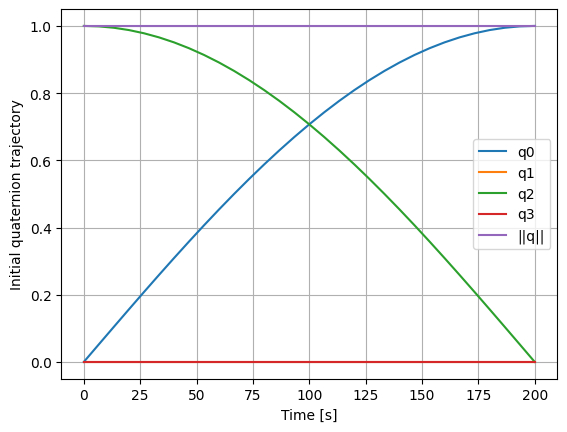

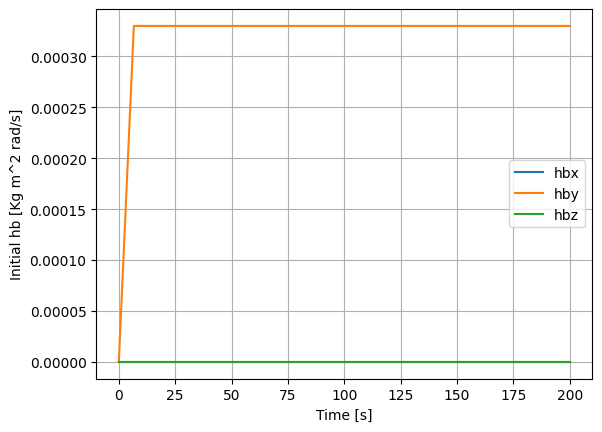

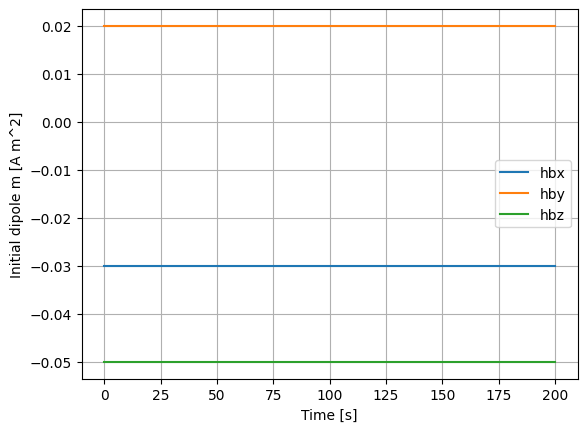

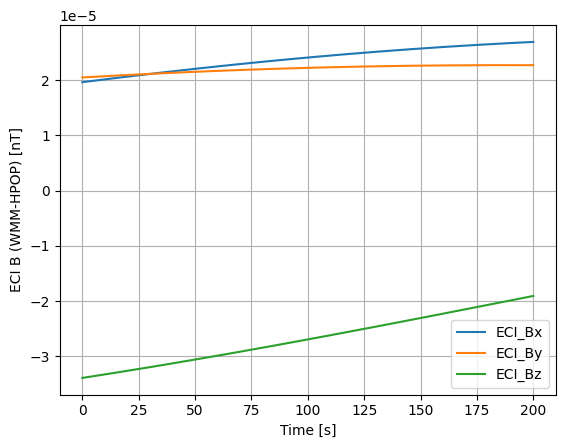

In [586]:
hu_value=np.copy(ohu_init)
hx_value=np.copy(ohx_init)

plt.figure(1)
plt.plot(np.linspace(0, tf, T+1), hx_value[0,:], label='q0')
plt.plot(np.linspace(0, tf, T+1), hx_value[1,:], label='q1')
plt.plot(np.linspace(0, tf, T+1), hx_value[2,:], label='q2')
plt.plot(np.linspace(0, tf, T+1), hx_value[3,:], label='q3')
plt.plot(np.linspace(0, tf, T+1), np.linalg.norm(hx_value[0:4,:],axis=0), label='||q||')
plt.ylabel('Initial quaternion trajectory')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

plt.figure(2)
plt.plot(np.linspace(0, tf, T+1), hx_value[4,:], label='hbx')
plt.plot(np.linspace(0, tf, T+1), hx_value[5,:], label='hby')
plt.plot(np.linspace(0, tf, T+1), hx_value[6,:], label='hbz')
plt.ylabel('Initial hb [Kg m^2 rad/s]')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

plt.figure(3)
plt.plot(np.linspace(0, tf, T+1), hu_value[0,:], label='hbx')
plt.plot(np.linspace(0, tf, T+1), hu_value[1,:], label='hby')
plt.plot(np.linspace(0, tf, T+1), hu_value[2,:], label='hbz')
plt.ylabel('Initial dipole m [A m^2]')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

plt.figure(4)
plt.plot(np.linspace(0, tf, int(tf / dt_wmm_double) + 1), N_B_precomputed[0,0:int(tf / dt_wmm_double) + 1], label='ECI_Bx')
plt.plot(np.linspace(0, tf, int(tf / dt_wmm_double) + 1), N_B_precomputed[1,0:int(tf / dt_wmm_double) + 1], label='ECI_By')
plt.plot(np.linspace(0, tf, int(tf / dt_wmm_double) + 1), N_B_precomputed[2,0:int(tf / dt_wmm_double) + 1], label='ECI_Bz')
plt.ylabel('ECI B (WMM-HPOP) [nT]')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

CVXpy Optimization problem (DPP compliant for cvxpygen)

In [587]:
x = cp.Variable((states_size, T + 1), name='x')
u = cp.Variable((inputs_size, T + 1), name='u')
vc = cp.Variable((states_size, T), name='vc')
if non_convex_inequalities_size>0:
    vi = cp.Variable((non_convex_inequalities_size, T+1), name='vi')

A_discrete = cp.Parameter((states_size,states_size*T), name='A_discrete')
B_discrete_l = cp.Parameter((states_size,inputs_size*T), name='B_discrete_l')
B_discrete_r = cp.Parameter((states_size,inputs_size*T), name='B_discrete_r')
y_discrete = cp.Parameter((states_size,1*T), name='y_discrete')

if non_convex_inequalities_size>0:
    C_discrete = cp.Parameter((non_convex_inequalities_size,states_size*(T+1)), name='C_discrete')
    D_discrete = cp.Parameter((non_convex_inequalities_size,inputs_size*(T+1)), name='D_discrete')
    z_discrete = cp.Parameter((non_convex_inequalities_size,1*(T+1)), name='z_discrete')

tau = cp.Parameter(name='tau')
sqrt_tau = cp.Parameter(name='sqrt_tau')
sqrt_alpha_m_sqrt_tau = cp.Parameter(name='sqrt_alpha_m_sqrt_tau')

start_pos = cp.Parameter((states_size,1), name='start_pos')
end_pos = cp.Parameter((states_size,1), name='end_pos')

start_input = cp.Parameter((inputs_size,1), name='start_input')
end_input = cp.Parameter((inputs_size,1), name='end_input')

ox_cvxpy = cp.Parameter((states_size,T + 1), name='ox_cvxpy')
ou_cvxpy = cp.Parameter((inputs_size,T + 1), name='ou_cvxpy')

S_x_scaling = cp.Parameter((states_size,states_size), name='S_x_scaling')
S_u_scaling = cp.Parameter((inputs_size,inputs_size), name='S_u_scaling')

c_x_scaling = cp.Parameter((states_size,1), name='c_x_scaling')
c_u_scaling = cp.Parameter((inputs_size,1), name='c_u_scaling')

inv_Jb_S_b_scaling = cp.Parameter((3,3), name='inv_Jb_S_b_scaling')
inv_Jb_c_b_scaling = cp.Parameter((3,1), name='inv_Jb_c_b_scaling')

lamb = cp.Parameter(name='lamb')
tau_lamb = cp.Parameter(name='tau_lamb')
etta = cp.Parameter(name='etta')

omega_max = cp.Parameter(name='omega_max')

m_max = cp.Parameter(name='m_max')

constraints = [
    x[:, 0] == start_pos[:,0],
    x[:, T] == end_pos[:,0],
    #u[:, 0] == start_input[:,0],
    #u[:, T] == end_input[:,0]
]

cost = 0

for k in range(0, T):
    cost += (1/3) * (cp.sum_squares(sqrt_tau*u[0:3,k:k+1]) + cp.sum_squares(sqrt_tau*u[0:3,k+1:k+2]) + cp.sum_squares(sqrt_tau*(u[0:3,k:k+1] - u[0:3,k+1:k+2])))
    
for k in range(1, T+1):
    cost += cp.sum_squares(sqrt_alpha_m_sqrt_tau*(u[0:3,k:k+1]-u[0:3,k-1:k]))
    
for k in range(0, T):
    cost += cp.norm(tau_lamb*vc[0:states_size, k:k+1],1)
    #cost += 10*cp.norm(tau_lamb*vc[4:7, k:k+1],1)

if non_convex_inequalities_size>0:
    for k in range(0, T+1):
        cost += cp.norm(tau_lamb*vi[0:non_convex_inequalities_size, k:k+1],1)

for k in range(0, T): # from 0 to T-1
    constraints += [x[0:states_size, k+1:k+2] == A_discrete[0:states_size,states_size*k:states_size*(k+1)] @ x[0:states_size, k:k+1] + B_discrete_l[0:states_size,inputs_size*k:inputs_size*(k+1)] @ u[0:inputs_size, k:k+1]+B_discrete_r[0:states_size,inputs_size*k:inputs_size*(k+1)] @ u[0:inputs_size, k+1:k+2]+y_discrete[0:states_size, k:k+1]+vc[0:states_size, k:k+1]]

if non_convex_inequalities_size>0:
    for k in range(0, T+1): # from 0 to T
        constraints += [C_discrete[0:non_convex_inequalities_size,states_size*k:states_size*(k+1)] @ x[0:states_size, k:k+1] + D_discrete[0:non_convex_inequalities_size,inputs_size*k:inputs_size*(k+1)] @ u[0:inputs_size, k:k+1]+z_discrete[0:non_convex_inequalities_size, k:k+1]<=vi[0:non_convex_inequalities_size, k:k+1]]

for k in range(0, T+1): # from 0 to T
    constraints += [cp.norm(x[0:states_size, k:k+1]-ox_cvxpy[0:states_size,k:k+1],'inf')+cp.norm(u[0:inputs_size, k:k+1]-ou_cvxpy[0:inputs_size,k:k+1],'inf')<=etta]

# Convex constraints
for k in range(0, T+1): # from 0 to T
    constraints += [cp.norm(inv_Jb_S_b_scaling@x[4:7,k:k+1]+inv_Jb_c_b_scaling, 2)<=omega_max]
for k in range(0, T+1): # from 0 to T-1
    constraints += [cp.norm(S_u_scaling[0:3,0:3]@u[0:3,k:k+1]+c_u_scaling[0:3,0:1], 'inf')<=m_max]

objective = cp.Minimize(cost)
problem = cp.Problem(objective, constraints)

In [588]:
print("Is DPP? ", problem.is_dcp(dpp=True))

Is DPP?  True


In [589]:
aux_A_discrete = np.zeros((states_size,states_size*T))
aux_B_discrete_l = np.zeros((states_size,inputs_size*T))
aux_B_discrete_r = np.zeros((states_size,inputs_size*T))
aux_y_discrete = np.zeros((states_size,1*T))

if non_convex_inequalities_size>0:
    aux_C_discrete = np.zeros((non_convex_inequalities_size,states_size*(T+1)))
    aux_D_discrete = np.zeros((non_convex_inequalities_size,inputs_size*(T+1)))
    aux_z_discrete = np.zeros((non_convex_inequalities_size,1*(T+1)))

In [590]:
def SCVx_scaling_x(x_no_scaled,inv_S_x_scaling_double,c_x_scaling_double):
    x_scaled = inv_S_x_scaling_double@(x_no_scaled-c_x_scaling_double)
    return x_scaled
    
def SCVx_scaling_u(u_no_scaled,inv_S_u_scaling_double,c_u_scaling_double):
    u_scaled = inv_S_u_scaling_double@(u_no_scaled-c_u_scaling_double)
    return u_scaled

def SCVx_inv_scaling_x(x_scaled,S_x_scaling_double,c_x_scaling_double):
    x_inv_scaling = S_x_scaling_double@x_scaled+c_x_scaling_double
    return x_inv_scaling
    
def SCVx_inv_scaling_u(u_scaled,S_u_scaling_double,c_u_scaling_double):
    u_inv_scaling = S_u_scaling_double@u_scaled+c_u_scaling_double
    return u_inv_scaling


def A_no_discrete_scaled_SCVx(A_no_discrete_no_scaled, inv_S_x_scaling_double,S_x_scaling_double):

    A_numeric = inv_S_x_scaling_double@A_no_discrete_no_scaled@S_x_scaling_double

    return A_numeric

def B_no_discrete_scaled_SCVx(B_no_discrete_no_scaled, inv_S_x_scaling_double, S_u_scaling_double):

    B_numeric = inv_S_x_scaling_double@B_no_discrete_no_scaled@S_u_scaling_double

    return B_numeric

def y_no_discrete_scaled_SCVx(A_no_discrete_no_scaled,
                              B_no_discrete_no_scaled,
                              y_no_discrete_no_scaled,
                              inv_S_x_scaling_double, c_x_scaling_double, c_u_scaling_double):

    y_numeric = inv_S_x_scaling_double@A_no_discrete_no_scaled@c_x_scaling_double
    y_numeric = y_numeric+inv_S_x_scaling_double@B_no_discrete_no_scaled@c_u_scaling_double
    y_numeric = y_numeric+inv_S_x_scaling_double@y_no_discrete_no_scaled

    return y_numeric
    
import numpy as np

def A_Bl_Br_y_discrete_scaled(
        ohx, ohu, t0, dynamic_parameters_double, tau_double,
        S_x_scaling_double, inv_S_x_scaling_double, c_x_scaling_double,
        S_u_scaling_double, inv_S_u_scaling_double, c_u_scaling_double,
        size_N):

    n = len(ohx)
    m = len(ohu)

    # Condiciones iniciales para la integración en el intervalo [t0, t0 + tau]
    Phi = np.eye(n)
    Gm  = np.zeros((n, m))   # B_k^-
    Gp  = np.zeros((n, m))   # B_k^+
    z   = np.zeros((n, 1))

    dt = tau_double / (size_N - 1)
    t  = t0
    tf = t0 + tau_double

    # Función auxiliar para Lambdas de FOH (Interpolación lineal)
    # lam_m(t0) = 1, lam_m(tf) = 0
    # lam_p(t0) = 0, lam_p(tf) = 1
    def lambdas(ti):
        lam_m = (tf - ti) / tau_double
        lam_p = (ti - t0) / tau_double
        return lam_m, lam_p

    def get_scaled_dynamics(t_eval):
        # 1. Obtener matrices continuas no escaladas (LTV: dependen de t)
        A_no = fgAByCDz.A_no_discrete_no_scaled_SCVx(ohx, ohu, t_eval, dynamic_parameters_double)
        B_no = fgAByCDz.B_no_discrete_no_scaled_SCVx(ohx, ohu, t_eval, dynamic_parameters_double)
        y_no = fgAByCDz.y_no_discrete_no_scaled_SCVx(ohx, ohu, t_eval, dynamic_parameters_double)

        # 2. Aplicar escalado
        A = A_no_discrete_scaled_SCVx(A_no, inv_S_x_scaling_double, S_x_scaling_double)
        B = B_no_discrete_scaled_SCVx(B_no, inv_S_x_scaling_double, S_u_scaling_double)
        y = y_no_discrete_scaled_SCVx(A_no, B_no, y_no, inv_S_x_scaling_double, c_x_scaling_double, c_u_scaling_double)
        return A, B, y

    for i in range(size_N - 1):
        # ===== k1 (Inicio del sub-paso) =====
        lam_m1, lam_p1 = lambdas(t)
        A1, B1, y1 = get_scaled_dynamics(t)

        k1_Phi = A1 @ Phi
        k1_Gm  = A1 @ Gm + B1 * lam_m1
        k1_Gp  = A1 @ Gp + B1 * lam_p1
        k1_z   = A1 @ z  + y1

        # ===== k2 (Punto medio) =====
        t2 = t + 0.5 * dt
        lam_m2, lam_p2 = lambdas(t2)
        A2, B2, y2 = get_scaled_dynamics(t2)

        Phi2 = Phi + 0.5 * dt * k1_Phi
        Gm2  = Gm  + 0.5 * dt * k1_Gm
        Gp2  = Gp  + 0.5 * dt * k1_Gp
        z2   = z   + 0.5 * dt * k1_z

        k2_Phi = A2 @ Phi2
        k2_Gm  = A2 @ Gm2 + B2 * lam_m2
        k2_Gp  = A2 @ Gp2 + B2 * lam_p2
        k2_z   = A2 @ z2  + y2

        # ===== k3 (Punto medio con k2) =====
        # En LTV, A, B y y son los mismos que en k2 porque t es el mismo
        Phi3 = Phi + 0.5 * dt * k2_Phi
        Gm3  = Gm  + 0.5 * dt * k2_Gm
        Gp3  = Gp  + 0.5 * dt * k2_Gp
        z3   = z   + 0.5 * dt * k2_z

        k3_Phi = A2 @ Phi3
        k3_Gm  = A2 @ Gm3 + B2 * lam_m2
        k3_Gp  = A2 @ Gp3 + B2 * lam_p2
        k3_z   = A2 @ z3  + y2

        # ===== k4 (Final del sub-paso) =====
        t4 = t + dt
        lam_m4, lam_p4 = lambdas(t4)
        A4, B4, y4 = get_scaled_dynamics(t4)

        Phi4 = Phi + dt * k3_Phi
        Gm4  = Gm  + dt * k3_Gm
        Gp4  = Gp  + dt * k3_Gp
        z4   = z   + dt * k3_z

        k4_Phi = A4 @ Phi4
        k4_Gm  = A4 @ Gm4 + B4 * lam_m4
        k4_Gp  = A4 @ Gp4 + B4 * lam_p4
        k4_z   = A4 @ z4  + y4

        # ===== RK4 Update =====
        Phi += (dt / 6) * (k1_Phi + 2*k2_Phi + 2*k3_Phi + k4_Phi)
        Gm  += (dt / 6) * (k1_Gm  + 2*k2_Gm  + 2*k3_Gm  + k4_Gm)
        Gp  += (dt / 6) * (k1_Gp  + 2*k2_Gp  + 2*k3_Gp  + k4_Gp)
        z   += (dt / 6) * (k1_z   + 2*k2_z   + 2*k3_z   + k4_z)

        t += dt

    # Resultados finales
    # Dado que integramos la forma completa de la ODE:
    # dot_G = A*G + B*lambda, el valor final ya es la matriz discreta.
    return Phi, Gm, Gp, z

def C_no_discrete_scaled_SCVx(C_no_discrete_no_scaled, S_x_scaling_double):

    C_numeric = C_no_discrete_no_scaled@S_x_scaling_double

    return C_numeric

def D_no_discrete_scaled_SCVx(D_no_discrete_no_scaled, S_u_scaling_double):

    D_numeric = D_no_discrete_no_scaled@S_u_scaling_double

    return D_numeric

def z_no_discrete_scaled_SCVx(C_no_discrete_no_scaled,
                              D_no_discrete_no_scaled,
                              z_no_discrete_no_scaled,
                              c_x_scaling_double, c_u_scaling_double):

    z_numeric = C_no_discrete_no_scaled@c_x_scaling_double
    z_numeric = z_numeric+D_no_discrete_no_scaled@c_u_scaling_double
    z_numeric = z_numeric+z_no_discrete_no_scaled

    return z_numeric

def C_D_z_discrete_scaled(ohx, ohu, t0, dynamic_parameters,
                           S_x_scaling_double, c_x_scaling_double,
                           S_u_scaling_double, c_u_scaling_double):
    

    C_no_discrete_no_scaled = fgAByCDz.C_no_discrete_no_scaled_SCVx(ohx, ohu, t0, dynamic_parameters)
    C_no_discrete_scaled = C_no_discrete_scaled_SCVx(C_no_discrete_no_scaled, S_x_scaling_double)

    
    D_no_discrete_no_scaled = fgAByCDz.D_no_discrete_no_scaled_SCVx(ohx, ohu, t0, dynamic_parameters)
    D_no_discrete_scaled = D_no_discrete_scaled_SCVx(D_no_discrete_no_scaled, S_u_scaling_double)

    z_no_discrete_no_scaled = fgAByCDz.z_no_discrete_no_scaled_SCVx(ohx, ohu, t0, dynamic_parameters)
    z_no_discrete_scaled = z_no_discrete_scaled_SCVx(C_no_discrete_no_scaled,
                                                     D_no_discrete_no_scaled,
                                                     z_no_discrete_no_scaled,
                                                     c_x_scaling_double, c_u_scaling_double)
    
    #Discretization no needed, bypass
    return C_no_discrete_scaled, D_no_discrete_scaled, z_no_discrete_scaled

def u_foh(uk, ukp1, dt_aux):
    return (1 - dt_aux) * uk + dt_aux * ukp1

def f_rk4_step_foh(xk, uk, ukp1, t, dt, dynamic_parameters,
                   S_x_scaling_double, c_x_scaling_double,
                   S_u_scaling_double, c_u_scaling_double):

    x = SCVx_inv_scaling_x(xk, S_x_scaling_double, c_x_scaling_double)
    uk = SCVx_inv_scaling_u(uk, S_u_scaling_double, c_u_scaling_double)
    ukp1 = SCVx_inv_scaling_u(ukp1, S_u_scaling_double, c_u_scaling_double)

    k1 = fgAByCDz.f_SCVx(x, u_foh(uk, ukp1, 0.0), t, dynamic_parameters)
    k2 = fgAByCDz.f_SCVx(x + 0.5*dt*k1, u_foh(uk, ukp1, 0.0), t + 0.5*dt, dynamic_parameters)
    k3 = fgAByCDz.f_SCVx(x + 0.5*dt*k2, u_foh(uk, ukp1, 0.0), t + 0.5*dt, dynamic_parameters)
    k4 = fgAByCDz.f_SCVx(x + dt*k3, u_foh(uk, ukp1, 0.0), t + dt, dynamic_parameters)

    return x + (dt/6.0)*(k1 + 2*k2 + 2*k3 + k4)

def f_Euler_step(xk, uk, t, dt, dynamic_parameters,
                 S_x_scaling_double,c_x_scaling_double,S_u_scaling_double,c_u_scaling_double):

    xk_no_scaled = SCVx_inv_scaling_x(xk,S_x_scaling_double,c_x_scaling_double)
    uk_no_scaled = SCVx_inv_scaling_u(uk,S_u_scaling_double,c_u_scaling_double)

    return xk_no_scaled + dt * fgAByCDz.f_SCVx(xk_no_scaled, uk_no_scaled, t, dynamic_parameters)

In [591]:
def J_SCVx(x,u,T,tau_double, dynamic_parameters,
           S_x_scaling_double,c_x_scaling_double,S_u_scaling_double,c_u_scaling_double):
    
    cost = 0
    
    for k in range(0, T): # from 1 to T-1
        cost += (tau_double/3) * (np.linalg.norm(u[0:3,k:k+1], ord=2)**2 + np.linalg.norm(u[0:3,k+1:k+2], ord=2)**2 + np.linalg.norm((u[0:3,k:k+1] - u[0:3,k+1:k+2]), ord=2)**2)
    for k in range(1, T+1): # from 1 to T
        cost += alpha_m_double*tau_double*np.linalg.norm(u[0:3,k:k+1]-u[0:3,k-1:k], ord=2)**2

    print("Cost: ",cost)
    for k in range(0, T): # from 0 to T-1

        flow_map = f_rk4_step_foh(x[0:, k:k+1], u[:, k:k+1], u[:, k+1:k+2], k/T*tf, tau_double, dynamic_parameters,
        S_x_scaling_double,c_x_scaling_double,S_u_scaling_double,c_u_scaling_double)

        SCVx_defect = SCVx_inv_scaling_x(x[:, k+1:k+2],S_x_scaling_double,c_x_scaling_double)-flow_map

        cost += tau_double*np.linalg.norm(lamb_double*SCVx_defect, ord=1)
    print("Cost + vc: ",cost)
    if non_convex_inequalities_size>0:
        for k in range(0, T+1): # from 0 to T
            x_no_scaled = SCVx_inv_scaling_x(x[:,k:k+1],S_x_scaling_double,c_x_scaling_double)
            u_no_scaled = SCVx_inv_scaling_u(u[:,k:k+1],S_u_scaling_double,c_u_scaling_double)
                    
            g_double = fgAByCDz.g_SCVx(x_no_scaled, u_no_scaled, k/T*tf, dynamic_parameters_double)

            for i in range(0,np.size(g_double)):
                cost += tau_double*np.abs(lamb_double*(np.max([g_double[i,0],0])))

    return cost

In [592]:
ox = np.zeros((states_size,T+1))
ou = np.zeros((inputs_size,T+1))

etta_double = np.copy(etta_double_init)

inv_S_x_scaling_double = np.linalg.inv(S_x_scaling_double)
inv_S_u_scaling_double = np.linalg.inv(S_u_scaling_double)

ohx = np.copy(ohx_init) 
ohu = np.copy(ohu_init)

for t in range(0, T + 1):
    ox[0:states_size,t:t+1] = SCVx_scaling_x(ohx[0:states_size,t:t+1],inv_S_x_scaling_double,c_x_scaling_double)

for t in range(0, T + 1):
    ou[0:inputs_size,t:t+1] = SCVx_scaling_u(ohu[0:inputs_size,t:t+1],inv_S_u_scaling_double,c_u_scaling_double)

ox_cvxpy.value=ox #trajectory initialization (already scaled)
ou_cvxpy.value=ou #trajectory initialization (already scaled)

tau.value = tau_double
sqrt_tau.value = (tau_double)**0.5

sqrt_alpha_m_sqrt_tau.value = (alpha_m_double)**0.5*(tau_double)**0.5
lamb.value = lamb_double

tau_lamb.value = tau_double*lamb_double
etta.value = etta_double

S_x_scaling.value = S_x_scaling_double
S_u_scaling.value = S_u_scaling_double

c_x_scaling.value = c_x_scaling_double
c_u_scaling.value = c_u_scaling_double

omega_max.value = omega_max_double
m_max.value = m_max_double

start_pos.value = SCVx_scaling_x(start_pos_double,inv_S_x_scaling_double,c_x_scaling_double)
end_pos.value = SCVx_scaling_x(end_pos_double,inv_S_x_scaling_double,c_x_scaling_double)

#start_input.value = SCVx_scaling_u(start_input_double,inv_S_u_scaling_double,c_u_scaling_double)
#end_input.value = SCVx_scaling_u(end_input_double,inv_S_u_scaling_double,c_u_scaling_double)

aux_end_pos_double = SCVx_scaling_x(end_pos_double,inv_S_x_scaling_double,c_x_scaling_double)

inv_Jb_S_b_scaling.value = np.linalg.inv(Jsat_double)@S_x_scaling_double[4:7,4:7]
inv_Jb_c_b_scaling.value = np.linalg.inv(Jsat_double)@c_x_scaling_double[4:7,0:1]

t0 = time.time()

i=1
no_first_iterations = False
rho_i = "None"

for COGU_iter in range(COGU_max_iter):

    for t in range(0, T + 1):
        ohx[0:states_size,t:t+1] = SCVx_inv_scaling_x(ox[0:states_size,t:t+1],S_x_scaling_double,c_x_scaling_double)

    for t in range(0, T + 1):
        ohu[0:inputs_size,t:t+1] = SCVx_inv_scaling_u(ou[0:inputs_size,t:t+1],S_u_scaling_double,c_u_scaling_double)

    t0aux = time.time()
    for k in range(0, T):
        aux_aux_A_discrete, aux_aux_B_discrete_l, aux_aux_B_discrete_r, aux_aux_y_discrete = A_Bl_Br_y_discrete_scaled(ohx[0:states_size,k:k+1], ohu[0:inputs_size,k:k+1], k/T*tf, dynamic_parameters_double, tau_double,
                          S_x_scaling_double, inv_S_x_scaling_double, c_x_scaling_double,
                          S_u_scaling_double, inv_S_u_scaling_double, c_u_scaling_double, size_N)

        aux_A_discrete[0:states_size,states_size*k:states_size*(k+1)] = np.copy(aux_aux_A_discrete)
        
        aux_B_discrete_l[0:states_size,inputs_size*k:inputs_size*(k+1)] = np.copy(aux_aux_B_discrete_l)
        
        aux_B_discrete_r[0:states_size,inputs_size*k:inputs_size*(k+1)] = np.copy(aux_aux_B_discrete_r)

        aux_y_discrete[0:states_size,k:k+1] = np.copy(aux_aux_y_discrete)
    
    if non_convex_inequalities_size>0:
      for k in range(0, T+1):
          aux_aux_C_discrete, aux_aux_D_discrete, aux_aux_z_discrete = C_D_z_discrete_scaled(ohx[0:states_size,k:k+1], ohu[0:inputs_size,k:k+1], k/T*tf, dynamic_parameters_double,
                  S_x_scaling_double, c_x_scaling_double,
                  S_u_scaling_double, c_u_scaling_double)
          
          aux_C_discrete[0:non_convex_inequalities_size,states_size*k:states_size*(k+1)] = np.copy(aux_aux_C_discrete)
        
          aux_D_discrete[0:non_convex_inequalities_size,inputs_size*k:inputs_size*(k+1)] = np.copy(aux_aux_D_discrete)
          
          aux_z_discrete[0:non_convex_inequalities_size,k:k+1] = np.copy(aux_aux_z_discrete)

    t1aux = time.time()
    print("Discretization time [ms]: ",(t1aux-t0aux)*1000)

    A_discrete.value = np.copy(aux_A_discrete)
    B_discrete_l.value = np.copy(aux_B_discrete_l)
    B_discrete_r.value = np.copy(aux_B_discrete_r)
    y_discrete.value = np.copy(aux_y_discrete)
    
    if non_convex_inequalities_size>0:
      C_discrete.value = np.copy(aux_C_discrete)
      D_discrete.value = np.copy(aux_D_discrete)
      z_discrete.value = np.copy(aux_z_discrete)

    t0aux = time.time()
    val=problem.solve(solver='ECOS',ignore_dpp=False) #IF YOU USE CVXPYGEN: ignore_dpp=False
    t1aux = time.time()

    vc_opt=np.copy(vc.value)
    if non_convex_inequalities_size>0:
      vi_opt=np.copy(vi.value)
    x_opt=np.copy(x.value)
    u_opt=np.copy(u.value)

    L_SCVx_opt=val

    oJ_SCVx=J_SCVx(ox,ou,T,tau_double, dynamic_parameters_double,
                      S_x_scaling_double,c_x_scaling_double,S_u_scaling_double,c_u_scaling_double)

    J_SCVx_opt=J_SCVx(x_opt,u_opt,T,tau_double, dynamic_parameters_double,
                      S_x_scaling_double,c_x_scaling_double,S_u_scaling_double,c_u_scaling_double)
    
    print("Iteration number: ",i," Etta: ",etta.value, " Rho: ",rho_i)
    print("L_SCVx_opt: "+str(val)+" J_SCVx_opt: "+str(J_SCVx_opt)+" oJ_SCVx: "+str(oJ_SCVx)+" Norm_x_diff: "+str(np.max(np.linalg.norm((x_opt-ox), ord=2,axis=0))),"\n")

    
    Delta_J_SCVx=oJ_SCVx-J_SCVx_opt
    #Delta_L_SCVx=J_SCVx_opt-L_SCVx_opt
    Delta_L_SCVx=oJ_SCVx-L_SCVx_opt

    #if (Delta_L_SCVx<e_tol*np.abs(oJ_SCVx) or np.max(np.linalg.norm((x_opt-ox), ord=1,axis=0))<epsilon_stop_norm) and no_first_iterations:
    if np.max(np.linalg.norm((x_opt-ox), ord=1,axis=0))<epsilon_stop_norm and no_first_iterations:
      x_global=np.copy(ox)
      u_global=np.copy(ou)
      print("COGU has converged! :)")
      break;
    else:
      rho_i=Delta_J_SCVx/Delta_L_SCVx
      if rho_i<rho0:
        etta.value=max([etta0,etta.value/beta_sh])
        ox=np.copy(ox)
        ou=np.copy(ou)
      if rho_i>=rho0 and rho_i<rho1:
        etta.value=max([etta0,etta.value/beta_sh])
        ox=np.copy(x_opt)
        ou=np.copy(u_opt)
      if rho_i>=rho1 and rho_i<rho2:
        ox=np.copy(x_opt)
        ou=np.copy(u_opt)
      if rho_i>=rho2:
        etta.value=min([etta1,beta_gr*etta.value])
        ox=np.copy(x_opt)
        ou=np.copy(u_opt)

    ox_cvxpy.value=np.copy(ox)
    ou_cvxpy.value=np.copy(ou)

    if i==3:
        no_first_iterations = True
    i=i+1
    
t1 = time.time()
print('\nCVXPY\nSolve time: %.3f ms' % (1000 * (t1 - t0)))

Discretization time [ms]:  137.04395294189453
Cost:  83.16666666666673
Cost + vc:  263191.38825249864
Cost:  640.5885051095056
Cost + vc:  98611.04715650254
Iteration number:  1  Etta:  1.0  Rho:  None
L_SCVx_opt: 1609.9385395807967 J_SCVx_opt: 98611.04715650254 oJ_SCVx: 263191.38825249864 Norm_x_diff: 0.26535484054096814 

Discretization time [ms]:  139.51826095581055
Cost:  640.5885051095056
Cost + vc:  98611.04715650254
Cost:  480.9612157963863
Cost + vc:  16001.698390744947
Iteration number:  2  Etta:  1.0  Rho:  0.6291743595603618
L_SCVx_opt: 3085.8565621811713 J_SCVx_opt: 16001.698390744947 oJ_SCVx: 98611.04715650254 Norm_x_diff: 0.14601329177770514 

Discretization time [ms]:  138.70906829833984
Cost:  480.9612157963863
Cost + vc:  16001.698390744947
Cost:  463.1397292663715
Cost + vc:  63173.00921920376
Iteration number:  3  Etta:  2.0  Rho:  0.8647912477514431
L_SCVx_opt: 1439.121540135455 J_SCVx_opt: 63173.00921920376 oJ_SCVx: 16001.698390744947 Norm_x_diff: 0.358513425422739

In [593]:
print("vc error (quaternion):")
print(np.linalg.norm((vc.value[0:4, :]), ord=1))

print("vc error (ang. velocity):")
print(np.linalg.norm((vc.value[4:7, :]), ord=1))

vc error (quaternion):
1.1204104812069228e-09
vc error (ang. velocity):
0.02270661783358015


C:\Users\franklin\AppData\Local\Temp\ipykernel_18012\2106995645.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  point_error[0,i] = math.acos(np.clip(BR[2,2], -1.0, 1.0))


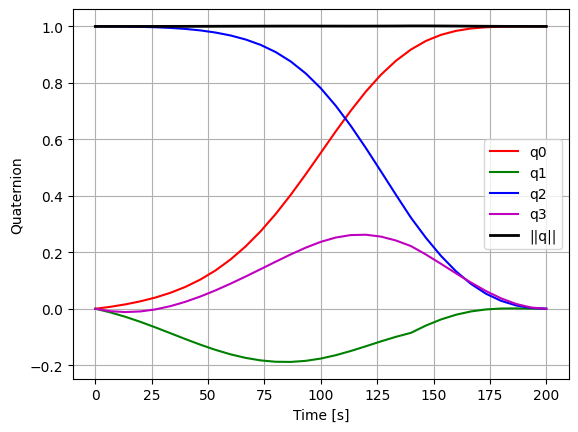

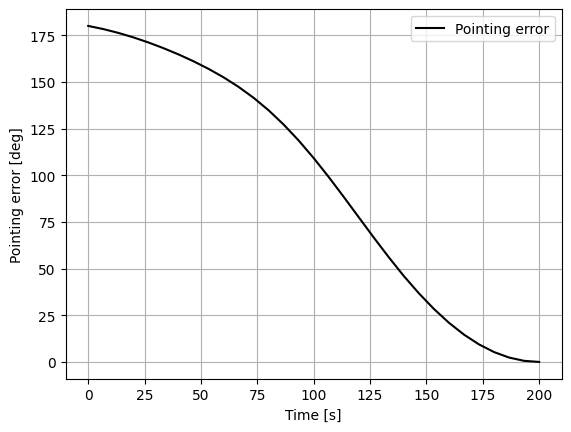

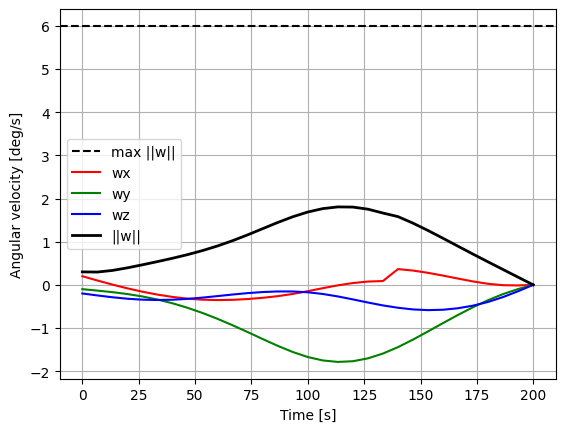

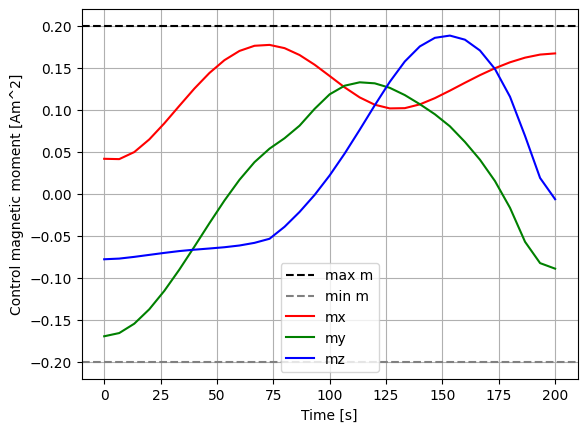

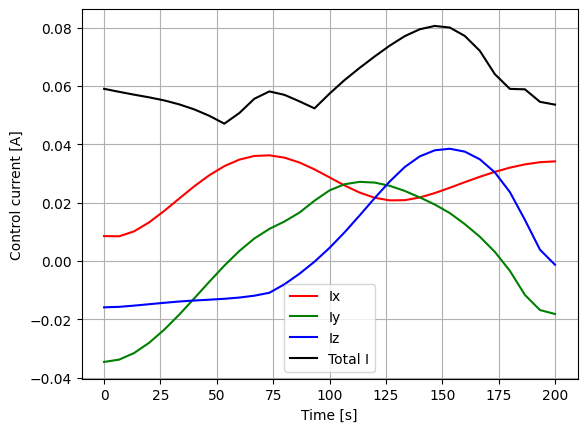

In [594]:
# Plot (scaled initial trajectories)
def global_inv_scaling(x,S,c,T):
    for i in range(0,T,1):
        x[:,i:i+1]=S@x[:,i:i+1]+c
    return x
#x_value = np.copy(x_global)
#u_value = np.copy(u_global)
x_value=global_inv_scaling(np.copy(ox),S_x_scaling_double,c_x_scaling_double,T+1)
u_value=global_inv_scaling(np.copy(ou),S_u_scaling_double,c_u_scaling_double,T+1)

for i in range(0,T+1):
    x_value[4:7,i:i+1] = np.linalg.inv(Jsat_double)@x_value[4:7,i:i+1]*180/np.pi

t1 = np.linspace(0, tf, T+1)
t2 = np.linspace(0, tf, T)

# --- Quaternion ---
plt.figure(1)
for i,c in zip(range(4),['r','g','b','m']):
    plt.plot(t1, x_value[i,:], c, label=f'q{i}')
plt.plot(t1, np.linalg.norm(x_value[0:4,:],axis=0), 'k', lw=2, label='||q||')
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Quaternion')

# --- Pointing error ---
plt.figure(2)

rot_RN = R.from_quat(end_quat.T)
RN = rot_RN.as_matrix()
point_error = np.zeros((1,T+1))

for i in range(0,T+1):
    rot_BN = R.from_quat(x_value[0:4,i])
    BN = rot_BN.as_matrix()
    BR = BN@RN.T
    point_error[0,i] = math.acos(np.clip(BR[2,2], -1.0, 1.0))

plt.plot(t1, point_error[0,:]*180/np.pi, 'k', label='Pointing error')
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Pointing error [deg]')


# --- Angular velocity ---
plt.figure(4)
plt.axhline( omega_max_double*180/np.pi, c='k', ls='--', label='max ||w||')
for i,c,l in zip(range(4,7),['r','g','b'],['wx','wy','wz']):
    plt.plot(t1, x_value[i,:], c, label=l)
plt.plot(t1, np.linalg.norm(x_value[4:7,:],axis=0), 'k', lw=2, label='||w||')
plt.grid(); plt.legend(); plt.xlabel('Time [s]'); plt.ylabel('Angular velocity [deg/s]')

# --- Magnetic moment ---
plt.figure(6)
plt.axhline( m_max_double, c='k', ls='--', label='max m')
plt.axhline(-m_max_double, c='gray', ls='--', label='min m')
for i,c,l in zip(range(3),['r','g','b'],['mx','my','mz']):
    plt.plot(t1, u_value[i,:], c, label=l)
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Control magnetic moment [Am^2]')

plt.show()

# --- Current ---
n_turns = 1000
A = 0.07*0.07

plt.figure(6)

for i,c,l in zip(range(3),['r','g','b'],['Ix','Iy','Iz']):
    plt.plot(t1, u_value[i,:]/(n_turns*A), c, label=l)
plt.plot(t1, np.sum(np.abs(u_value[:,:]/(n_turns*A)),axis = 0), 'k', label="Total I")
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Control current [A]')

plt.show()

# CVXpygen (Waskiri-Sat)

In [48]:
from cvxpygen import cpg
cpg.generate_code(problem, code_dir='WaskiriSat_T31_WMM_ECOS',solver='ECOS',unroll=False,wrapper=True)

KeyboardInterrupt: 

In [92]:
from WaskiriSat_T31_WMM_ECOS.cpg_solver import cpg_solve #CHANGE
import numpy as np
import pickle
import time
import matplotlib.pyplot as plt

with open('WaskiriSat_T31_WMM_ECOS/problem.pickle', 'rb') as file: #CHANGE
    problem = pickle.load(file)

problem.register_solve('cpg', cpg_solve)

In [295]:
ox = np.zeros((states_size, T+1)) 
ou = np.zeros((inputs_size, T+1))

etta_double = np.copy(etta_double_init)

inv_S_x_scaling_double = np.linalg.inv(S_x_scaling_double)
inv_S_u_scaling_double = np.linalg.inv(S_u_scaling_double)

ohx = np.copy(ohx_init) 
ohu = np.copy(ohu_init)

for t in range(0, T + 1):
    ox[0:states_size, t:t+1] = SCVx_scaling_x(
        ohx[0:states_size, t:t+1],
        inv_S_x_scaling_double,
        c_x_scaling_double
    )

for t in range(0, T + 1):
    ou[0:inputs_size, t:t+1] = SCVx_scaling_u(
        ohu[0:inputs_size, t:t+1],
        inv_S_u_scaling_double,
        c_u_scaling_double
    )

problem.param_dict['ox_cvxpy'].value = ox
problem.param_dict['ou_cvxpy'].value = ou

#problem.param_dict['tau'].value = tau_double
problem.param_dict['sqrt_tau'].value = tau_double**0.5
problem.param_dict['sqrt_alpha_m_sqrt_tau'].value = (alpha_m_double**0.5) * (tau_double**0.5)
#problem.param_dict['lamb'].value = lamb_double

problem.param_dict['tau_lamb'].value = tau_double * lamb_double
problem.param_dict['etta'].value = etta_double

#problem.param_dict['S_x_scaling'].value = S_x_scaling_double
problem.param_dict['S_u_scaling'].value = S_u_scaling_double

#problem.param_dict['c_x_scaling'].value = c_x_scaling_double
problem.param_dict['c_u_scaling'].value = c_u_scaling_double

problem.param_dict['omega_max'].value = omega_max_double
problem.param_dict['m_max'].value = m_max_double

problem.param_dict['start_pos'].value = SCVx_scaling_x(
    start_pos_double,
    inv_S_x_scaling_double,
    c_x_scaling_double
)

problem.param_dict['end_pos'].value = SCVx_scaling_x(
    end_pos_double,
    inv_S_x_scaling_double,
    c_x_scaling_double
)

aux_end_pos_double = SCVx_scaling_x(
    end_pos_double,
    inv_S_x_scaling_double,
    c_x_scaling_double
)

problem.param_dict['inv_Jb_S_b_scaling'].value = (
    np.linalg.inv(Jsat_double) @ S_x_scaling_double[4:7, 4:7]
)

problem.param_dict['inv_Jb_c_b_scaling'].value = (
    np.linalg.inv(Jsat_double) @ c_x_scaling_double[4:7, 0:1]
)

t0 = time.time()

i = 1
no_first_iterations = False
rho_i = "None"

for COGU_iter in range(COGU_max_iter):

    for t in range(0, T + 1):
        ohx[0:states_size, t:t+1] = SCVx_inv_scaling_x(
            ox[0:states_size, t:t+1],
            S_x_scaling_double,
            c_x_scaling_double
        )

    for t in range(0, T + 1):
        ohu[0:inputs_size, t:t+1] = SCVx_inv_scaling_u(
            ou[0:inputs_size, t:t+1],
            S_u_scaling_double,
            c_u_scaling_double
        )

    t0aux = time.time()

    for k in range(0, T):
        A_k, B_l_k, B_r_k, y_k = A_Bl_Br_y_discrete_scaled(
            ohx[:, k:k+1],
            ohu[:, k:k+1],
            k/T*tf,
            dynamic_parameters_double,
            tau_double,
            S_x_scaling_double,
            inv_S_x_scaling_double,
            c_x_scaling_double,
            S_u_scaling_double,
            inv_S_u_scaling_double,
            c_u_scaling_double,
            size_N
        )

        aux_A_discrete[:, states_size*k:states_size*(k+1)] = A_k
        aux_B_discrete_l[:, inputs_size*k:inputs_size*(k+1)] = B_l_k
        aux_B_discrete_r[:, inputs_size*k:inputs_size*(k+1)] = B_r_k
        aux_y_discrete[:, k:k+1] = y_k

    if non_convex_inequalities_size > 0:
        for k in range(0, T+1):
            C_k, D_k, z_k = C_D_z_discrete_scaled(
                ohx[:, k:k+1],
                ohu[:, k:k+1],
                k/T*tf,
                dynamic_parameters_double,
                S_x_scaling_double,
                c_x_scaling_double,
                S_u_scaling_double,
                c_u_scaling_double
            )

            aux_C_discrete[:, states_size*k:states_size*(k+1)] = C_k
            aux_D_discrete[:, inputs_size*k:inputs_size*(k+1)] = D_k
            aux_z_discrete[:, k:k+1] = z_k

    t1aux = time.time()
    print("Discretization time [ms]: ", (t1aux - t0aux)*1000)

    problem.param_dict['A_discrete'].value = aux_A_discrete
    problem.param_dict['B_discrete_l'].value = aux_B_discrete_l
    problem.param_dict['B_discrete_r'].value = aux_B_discrete_r
    problem.param_dict['y_discrete'].value = aux_y_discrete

    if non_convex_inequalities_size > 0:
        problem.param_dict['C_discrete'].value = aux_C_discrete
        problem.param_dict['D_discrete'].value = aux_D_discrete
        problem.param_dict['z_discrete'].value = aux_z_discrete

    t0aux = time.time()
    val = problem.solve(method='cpg',maxit=100)
    print("Solver time [ms]: ", (time.time() - t0aux)*1000)

    vc_opt = np.copy(problem.var_dict['vc'].value)
    if non_convex_inequalities_size > 0:
        vi_opt = np.copy(problem.var_dict['vi'].value)

    x_opt = np.copy(problem.var_dict['x'].value)
    u_opt = np.copy(problem.var_dict['u'].value)

    oJ_SCVx = J_SCVx(
        ox, ou, T, tau_double, dynamic_parameters_double,
        S_x_scaling_double, c_x_scaling_double,
        S_u_scaling_double, c_u_scaling_double
    )

    J_SCVx_opt = J_SCVx(
        x_opt, u_opt, T, tau_double, dynamic_parameters_double,
        S_x_scaling_double, c_x_scaling_double,
        S_u_scaling_double, c_u_scaling_double
    )

    print("Iteration number: ",i," Etta: ",problem.param_dict['etta'].value, " Rho: ",rho_i)
    print("L_SCVx_opt: "+str(val)+" J_SCVx_opt: "+str(J_SCVx_opt)+" oJ_SCVx: "+str(oJ_SCVx)+" Norm_x_diff: "+str(np.max(np.linalg.norm((x_opt-ox), ord=2,axis=0))),"\n")

    Delta_J_SCVx = oJ_SCVx - J_SCVx_opt
    Delta_L_SCVx = oJ_SCVx - val

    if (
        (np.max(np.linalg.norm(x_opt-ox, axis=0)) < epsilon_stop_norm)
        and no_first_iterations
    ):
        print("COGU has converged! :)")
        break
    else:
      rho_i=Delta_J_SCVx/Delta_L_SCVx
      if rho_i<rho0:
        problem.param_dict['etta'].value=max([etta0,problem.param_dict['etta'].value/beta_sh])
        ox=np.copy(ox)
        ou=np.copy(ou)
      if rho_i>=rho0 and rho_i<rho1:
        problem.param_dict['etta'].value=max([etta0,problem.param_dict['etta'].value/beta_sh])
        ox=np.copy(x_opt)
        ou=np.copy(u_opt)
      if rho_i>=rho1 and rho_i<rho2:
        ox=np.copy(x_opt)
        ou=np.copy(u_opt)
      if rho_i>=rho2:
        problem.param_dict['etta'].value=min([etta1,beta_gr*problem.param_dict['etta'].value])
        ox=np.copy(x_opt)
        ou=np.copy(u_opt)

    problem.param_dict['ox_cvxpy'].value = ox
    problem.param_dict['ou_cvxpy'].value = ou

    if i == 3:
        no_first_iterations = True

    i += 1

t1 = time.time()
print('\nCVXPY\nSolve time: %.3f ms' % (1000 * (t1 - t0)))

Discretization time [ms]:  143.5854434967041
Solver time [ms]:  51.64980888366699
Cost:  83.16666666666673
Cost + vc:  13863.278596131486
Cost:  70.31820091317113
Cost + vc:  10700.664167610144
Iteration number:  1  Etta:  1.0  Rho:  None
L_SCVx_opt: 306.2251592329635 J_SCVx_opt: 10700.664167610144 oJ_SCVx: 13863.278596131486 Norm_x_diff: 0.13915102575385832 

Discretization time [ms]:  140.98811149597168
Solver time [ms]:  82.09013938903809
Cost:  70.31820091317113
Cost + vc:  10700.664167610144
Cost:  67.06907020938833
Cost + vc:  3296.586195533177
Iteration number:  2  Etta:  1.0  Rho:  0.2332818442622337
L_SCVx_opt: 67.06910167828853 J_SCVx_opt: 3296.586195533177 oJ_SCVx: 10700.664167610144 Norm_x_diff: 0.06539925290247443 

Discretization time [ms]:  145.85018157958984
Solver time [ms]:  95.56126594543457
Cost:  67.06907020938833
Cost + vc:  3296.586195533177
Cost:  111.39405399913518
Cost + vc:  12931.324264339646
Iteration number:  3  Etta:  1.0  Rho:  0.6962911344817253
L_SCVx_

In [296]:
print("vc error (quaternion):")
print(np.linalg.norm((problem.var_dict['vc'].value[0:4, :]), ord=1))

print("vc error (ang. velocity):")
print(np.linalg.norm((problem.var_dict['vc'].value[4:7, :]), ord=1))

vc error (quaternion):
1.1552284890808645e-10
vc error (ang. velocity):
0.0025373203550561074


C:\Users\franklin\AppData\Local\Temp\ipykernel_17276\4004544860.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  point_error[0,i] = math.acos(BR[2,2])


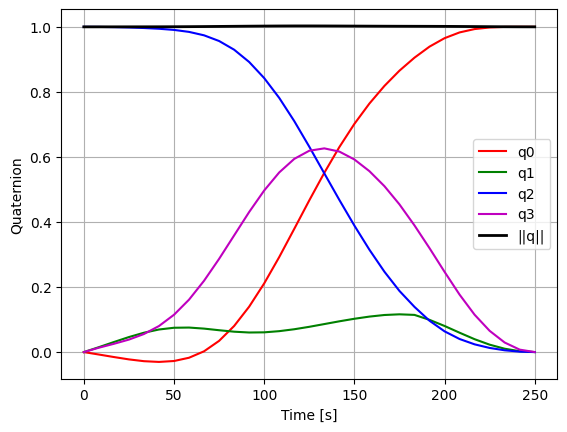

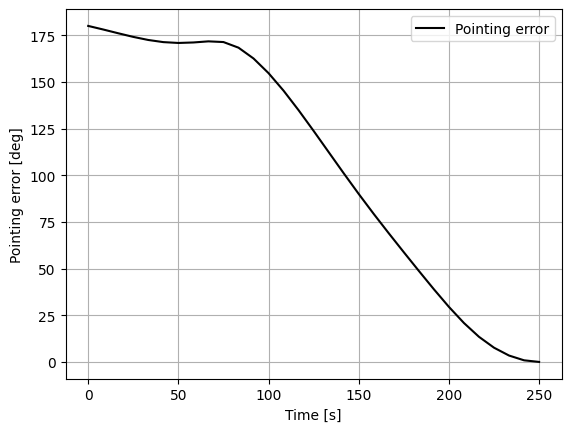

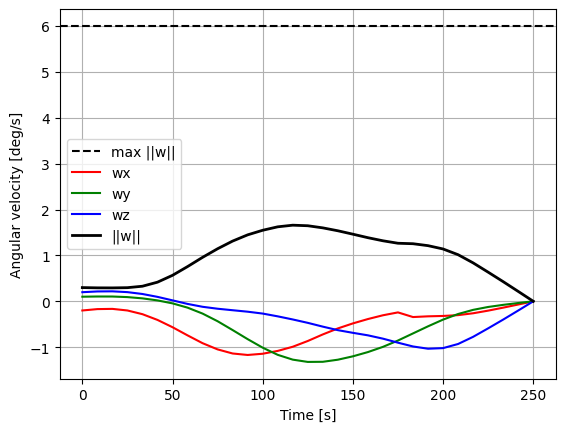

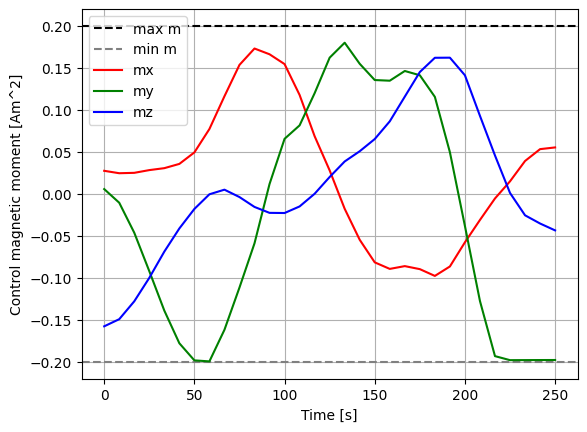

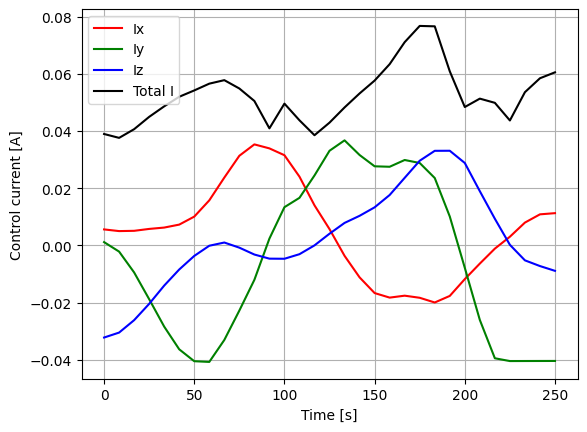

In [1158]:
# Plot (scaled initial trajectories)
def global_inv_scaling(x,S,c,T):
    for i in range(0,T,1):
        x[:,i:i+1]=S@x[:,i:i+1]+c
    return x
#x_value = np.copy(x_global)
#u_value = np.copy(u_global)
x_value=global_inv_scaling(np.copy(ox),S_x_scaling_double,c_x_scaling_double,T+1)
u_value=global_inv_scaling(np.copy(ou),S_u_scaling_double,c_u_scaling_double,T+1)

for i in range(0,T+1):
    x_value[4:7,i:i+1] = np.linalg.inv(Jsat_double)@x_value[4:7,i:i+1]*180/np.pi

t1 = np.linspace(0, tf, T+1)
t2 = np.linspace(0, tf, T)

# --- Quaternion ---
plt.figure(1)
for i,c in zip(range(4),['r','g','b','m']):
    plt.plot(t1, x_value[i,:], c, label=f'q{i}')
plt.plot(t1, np.linalg.norm(x_value[0:4,:],axis=0), 'k', lw=2, label='||q||')
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Quaternion')

# --- Pointing error ---
plt.figure(2)

rot_RN = R.from_quat(end_quat.T)
RN = rot_RN.as_matrix()
point_error = np.zeros((1,T+1))

for i in range(0,T+1):
    rot_BN = R.from_quat(x_value[0:4,i])
    BN = rot_BN.as_matrix()
    BR = BN@RN.T
    point_error[0,i] = math.acos(BR[2,2])

plt.plot(t1, point_error[0,:]*180/np.pi, 'k', label='Pointing error')
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Pointing error [deg]')


# --- Angular velocity ---
plt.figure(4)
plt.axhline( omega_max_double*180/np.pi, c='k', ls='--', label='max ||w||')
for i,c,l in zip(range(4,7),['r','g','b'],['wx','wy','wz']):
    plt.plot(t1, x_value[i,:], c, label=l)
plt.plot(t1, np.linalg.norm(x_value[4:7,:],axis=0), 'k', lw=2, label='||w||')
plt.grid(); plt.legend(); plt.xlabel('Time [s]'); plt.ylabel('Angular velocity [deg/s]')

# --- Magnetic moment ---
plt.figure(6)
plt.axhline( m_max_double, c='k', ls='--', label='max m')
plt.axhline(-m_max_double, c='gray', ls='--', label='min m')
for i,c,l in zip(range(3),['r','g','b'],['mx','my','mz']):
    plt.plot(t1, u_value[i,:], c, label=l)
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Control magnetic moment [Am^2]')

plt.show()

# --- Current ---
n_turns = 1000
A = 0.07*0.07

plt.figure(6)

for i,c,l in zip(range(3),['r','g','b'],['Ix','Iy','Iz']):
    plt.plot(t1, u_value[i,:]/(n_turns*A), c, label=l)
plt.plot(t1, np.sum(np.abs(u_value[:,:]/(n_turns*A)),axis = 0), 'k', label="Total I")
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Control current [A]')

plt.show()

# CVXpygen, C files copy and paste

In [2]:
import os
import shutil
import re

def collect_files(source_folder):
    # Define the destination folder
    destination_folder = os.path.join(source_folder, 'simulink_copy')
    
    # Create the destination folder if it doesn't exist
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)
    
    # Files to delete
    files_to_delete = ['runecos_exp.c', 'runecos.c','CMakeCCompilerId.c']
    
    # Files in which to replace 'pinv' with 'pinv2'
    files_to_replace = ['splamm.h', 'splamm.c', 'preproc.c']
    
    # Files to modify by removing "../../include/"
    files_to_modify = ['ldl.h', 'ldl.c']

    # Walk through the source folder and its subfolders
    for root, dirs, files in os.walk(source_folder):
        # Skip the destination folder
        if root == destination_folder:
            continue
        
        for file in files:
            file_path = os.path.join(root, file)
            
            if file.endswith('.c') or file.endswith('.h'):
                # Copy the file to the destination folder
                shutil.copy(file_path, destination_folder)
                print(f"Copied {file_path} to {destination_folder}")

    # After all files are copied, process the files in the destination folder
    for file in os.listdir(destination_folder):
        file_path = os.path.join(destination_folder, file)
        
        # Delete the specified files
        if file in files_to_delete:
            os.remove(file_path)
            print(f"Deleted {file_path}")
            continue
        
        # Modify ldl.h and ldl.c files to remove "../../include/"
        if file in files_to_modify:
            with open(file_path, 'r') as f:
                content = f.read()
            content = content.replace('../../include/', '')
            with open(file_path, 'w') as f:
                f.write(content)
            print(f"Modified {file} to remove '../../include/'")
        
        # Replace 'pinv' function calls with 'pinv2' in specified files
        if file in files_to_replace:
            with open(file_path, 'r') as f:
                content = f.read()
            content = re.sub(r'\bpinv\b\s*\(', 'pinv2(', content)
            with open(file_path, 'w') as f:
                f.write(content)
            print(f"Replaced 'pinv' function calls with 'pinv2' in {file}")

# Usage example
source_folder = 'WaskiriSat_T31_WMM_ECOS'
collect_files(source_folder)

Copied WaskiriSat_T31_WMM_ECOS\c\build\CMakeFiles\4.2.1\CompilerIdC\CMakeCCompilerId.c to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\include\cpg_solve.h to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\include\cpg_workspace.h to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\solver_code\ecos_bb\ecos_bb.c to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\solver_code\ecos_bb\ecos_bb_preproc.c to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\solver_code\external\amd\include\amd.h to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\solver_code\external\amd\include\amd_internal.h to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\solver_code\external\amd\src\amd_1.c to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied WaskiriSat_T31_WMM_ECOS\c\solver_code\external\amd\src\amd_2.c to WaskiriSat_T31_WMM_ECOS\simulink_copy
Copied 

# Open loop simulation

Precomputed WMM, inference time [ms] 6.983280181884766


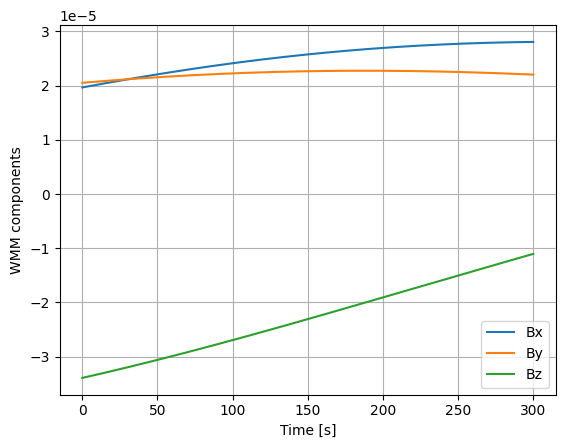

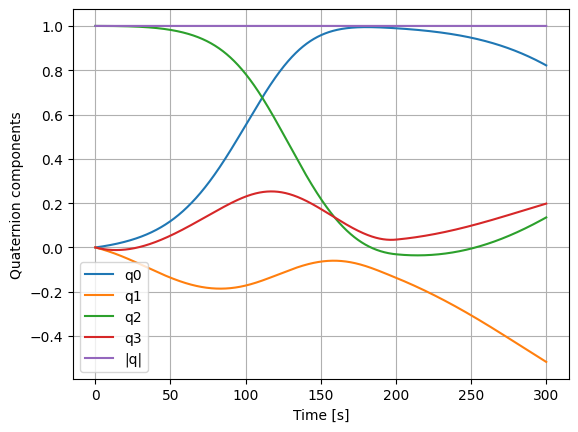

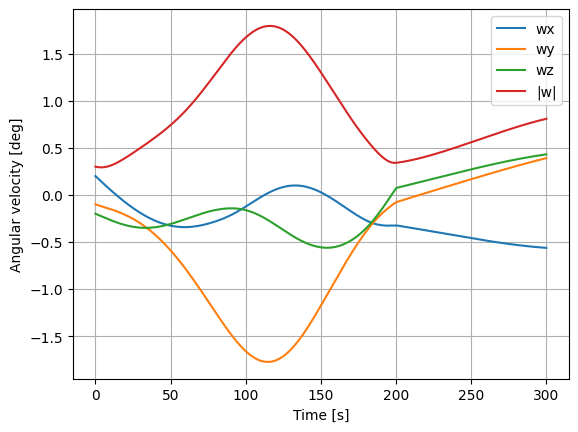

C:\Users\franklin\AppData\Local\Temp\ipykernel_18012\1771520857.py:253: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  point_error[0,i] = math.acos(BR[2,2])


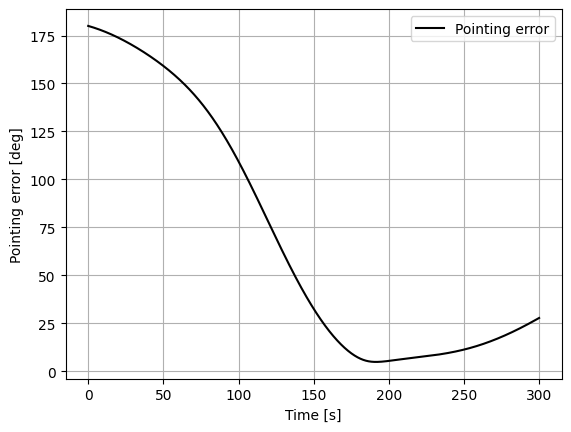

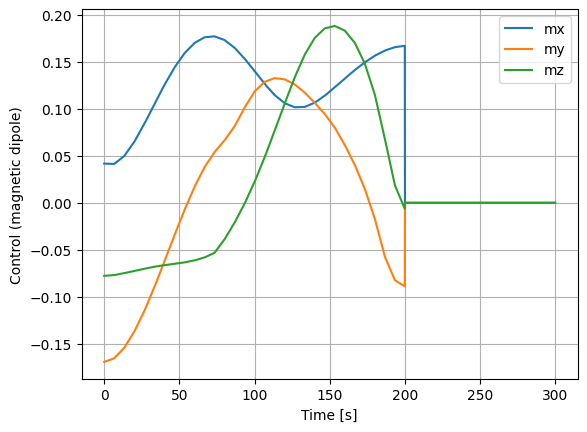

In [595]:
import numpy as np
import custom_time_varying_functions as ctvf

def u_interpol_zoh(t, u_value, dt_control):
    """
    Zero-order hold interpolation
    u_value: shape (3, T_control)
    dt_control: paso de discretización del control
    """

    T_control = u_value.shape[1]

    index = int(np.floor(t / dt_control))

    if index >= T_control:
        index = T_control - 1

    return u_value[:, index]

def u_interpol_linear(t, u_value, dt_control, t_lat=0.0):
    """
    Linear interpolation of control input after a latency time t_lat.
    
    Parameters
    ----------
    t : float
        Current simulation time
    u_value : ndarray shape (3, T_control)
        Discrete control samples
    dt_control : float
        Control sampling time
    t_lat : float
        Latency time before control starts [s]

    Returns
    -------
    u_interp : ndarray shape (3,)
        Interpolated control vector at time t
    """
    T_control = u_value.shape[1]

    if t < t_lat:
        # Antes de t_lat → mantener primer valor o cero
        return np.zeros(3)  # o np.zeros(3)
    
    # Ajustar tiempo relativo a t_lat
    t_rel = t - t_lat

    # Índice inferior
    index = int(np.floor(t_rel / dt_control))

    # Si estamos fuera del rango → mantener último valor
    if index >= T_control - 1:
        return np.zeros(3)

    # Tiempo local dentro del intervalo
    t0 = index * dt_control
    alpha = (t_rel - t0) / dt_control  # 0 ≤ alpha < 1

    # Interpolación lineal
    u0 = u_value[:, index]
    u1 = u_value[:, index + 1]
    
    return (1 - alpha) * u0 + alpha * u1
    
def quat_to_dcm(q):
    q0, q1, q2, q3 = q
    return np.array([
        [q0**2 + q1**2 - q2**2 - q3**2, 2*(q1*q2 + q0*q3), 2*(-q0*q2 + q1*q3)],
        [2*(q1*q2 - q0*q3), q0**2 - q1**2 + q2**2 - q3**2, 2*(q0*q1 + q2*q3)],
        [2*(q0*q2 + q1*q3), 2*(-q0*q1 + q2*q3), q0**2 - q1**2 - q2**2 + q3**2]
    ])

def dcm_ZXZ(Omega, inc, theta):
    cO = np.cos(Omega)
    sO = np.sin(Omega)
    ci = np.cos(inc)
    si = np.sin(inc)
    ct = np.cos(theta)
    st = np.sin(theta)

    Rz1 = np.array([[cO, -sO, 0],
                    [sO,  cO, 0],
                    [0,   0,  1]])

    Rx  = np.array([[1, 0, 0],
                    [0, ci, -si],
                    [0, si,  ci]])

    Rz2 = np.array([[ct, -st, 0],
                    [st,  ct, 0],
                    [0,   0,  1]])

    return (Rz1 @ Rx @ Rz2).T


# =============================
# Dinámica
# =============================

def dynamics(t, x, u, params):

    q = x[0:4]
    w = x[4:7]
    m = u[0:3]

    I = params["I"]
    I_inv = params["I_inv"]
    N_B_precomputed=params["N_B_precomputed"]
    size_N_B_precomputed=params["size_N_B_precomputed"]
    tf=params["tf"]
    mRMM = params["mRMM"]

    BN = quat_to_dcm(q)
    N_B = ctvf.ECI_B_function(t, N_B_precomputed, size_N_B_precomputed, tf)

    torque = np.cross(m+mRMM[0:3,0], BN @ N_B[0:3,0])

    w_dot = I_inv @ (-np.cross(w, I @ w) + torque)

    q0, q1, q2, q3 = q
    wx, wy, wz = w

    q_dot = 0.5 * np.array([
        -wx*q1 - wy*q2 - wz*q3,
         wx*q0 + wz*q2 - wy*q3,
         wy*q0 - wz*q1 + wx*q3,
         wz*q0 + wy*q1 - wx*q2
    ])

    return np.concatenate((q_dot, w_dot))


# =============================
# RK4
# =============================

def rk4_step(f, t, x, u, dt, params):

    k1 = f(t, x, u, params)
    k2 = f(t + dt/2, x + dt/2 * k1, u, params)
    k3 = f(t + dt/2, x + dt/2 * k2, u, params)
    k4 = f(t + dt, x + dt * k3, u, params)

    x_next = x + dt/6 * (k1 + 2*k2 + 2*k3 + k4)

    # Normalizar cuaternión
    #x_next[0:4] /= np.linalg.norm(x_next[0:4])

    return x_next


# =============================
# Simulación
# =============================

inertia_error = 0*0.001 
I = np.array([[Jsat_double[0,0]+inertia_error,Jsat_double[0,1],Jsat_double[0,2]+inertia_error],
              [Jsat_double[1,0],Jsat_double[1,1]-inertia_error,Jsat_double[2,1]],
              [Jsat_double[2,0]+inertia_error,Jsat_double[2,1],Jsat_double[2,2]]])

sim_time = tf+100
N_B_precomputed = ctvf.precompute_B_wmm(v0_double,r0_double,JD_double,dt_wmm_double,sim_time)*10**(-9) #nT

params = {
    "I": I,
    "I_inv": np.linalg.inv(I),
    "mRMM": mRMM_double,
    "tf": sim_time,
    "N_B_precomputed":N_B_precomputed, "size_N_B_precomputed":len(N_B_precomputed.T)
}

x = np.array([start_quat[0,0], start_quat[1,0], start_quat[2,0], start_quat[3,0], start_w_xyz[0,0], start_w_xyz[1,0], start_w_xyz[2,0]])

dt_state = 0.1 # step RK4 (closed loop)
dt_control = tau_double  # COGU control each tau_double [s]
N = int((sim_time)/dt_state)+1

q_history = np.zeros((N, 4))
w_history = np.zeros((N, 3))
t_history = np.zeros(N)
u_history = np.zeros((N, 3))
t=0
t_lat = 0 #COGU latency

for i in range(N):
    q_history[i] = x[0:4]
    w_history[i] = x[4:7]
    t_history[i] = t

    #u_current = u_interpol_zoh(t, u_value, dt_control)
    u_current = u_interpol_linear(t, u_value, dt_control, t_lat)
    
    u_history[i] = u_current   # <-- guardar control

    x = rk4_step(dynamics, t, x, u_current, dt_state, params)
    t += dt_state


# =============================
# Plot quaternion
# =============================

plt.figure(1)
plt.plot(np.linspace(0, sim_time, len(N_B_precomputed.T)), N_B_precomputed[0, :])
plt.plot(np.linspace(0, sim_time, len(N_B_precomputed.T)), N_B_precomputed[1, :])
plt.plot(np.linspace(0, sim_time, len(N_B_precomputed.T)), N_B_precomputed[2, :])

plt.xlabel("Time [s]")
plt.ylabel("WMM components")
plt.legend(["Bx", "By", "Bz"])
plt.grid(True)
plt.show()

plt.figure(1)
plt.plot(t_history, q_history[:, 0])
plt.plot(t_history, q_history[:, 1])
plt.plot(t_history, q_history[:, 2])
plt.plot(t_history, q_history[:, 3])
plt.plot(t_history, np.linalg.norm(q_history,ord=2,axis=1))
plt.xlabel("Time [s]")
plt.ylabel("Quaternion components")
plt.legend(["q0", "q1", "q2", "q3", "|q|"])
plt.grid(True)
plt.show()

# =============================
# Plot angular velocity
# =============================

plt.figure(1)
plt.plot(t_history, w_history[:, 0]*180/np.pi)
plt.plot(t_history, w_history[:, 1]*180/np.pi)
plt.plot(t_history, w_history[:, 2]*180/np.pi)
plt.plot(t_history, np.linalg.norm(w_history,ord=2,axis=1)*180/np.pi)
plt.xlabel("Time [s]")
plt.ylabel("Angular velocity [deg]")
plt.legend(["wx", "wy", "wz", "|w|"])
plt.grid(True)
plt.show()

# --- Pointing error ---
plt.figure(2)

rot_RN = R.from_quat(end_quat.T)
RN = rot_RN.as_matrix()
point_error = np.zeros((1,N))

for i in range(N):
    rot_BN = R.from_quat(q_history[i, :])
    BN = rot_BN.as_matrix()
    BR = BN@RN.T
    point_error[0,i] = math.acos(BR[2,2])

plt.plot(t_history, point_error[0,:]*180/np.pi, 'k', label='Pointing error')
plt.grid(); plt.legend(); plt.xlabel('Time [s]');plt.ylabel('Pointing error [deg]')

plt.figure()
plt.plot(t_history, u_history[:, 0])
plt.plot(t_history, u_history[:, 1])
plt.plot(t_history, u_history[:, 2])
plt.xlabel("Time [s]")
plt.ylabel("Control (magnetic dipole)")
plt.legend(["mx", "my", "mz"])
plt.grid(True)
plt.show()

# MPC tracking

In [1162]:
# It works (best)
tf_MPC = 5
T_MPC  = 50
dt_MPC = tf_MPC/T_MPC
states_size_MPC = 6
quaternion_size_MPC = 3

In [577]:
# It works
tf_MPC = 10
T_MPC  = 20
dt_MPC = tf_MPC/T_MPC
states_size_MPC = 6
quaternion_size_MPC = 3

In [1365]:
tf_MPC = 50
T_MPC  = 50
dt_MPC = tf_MPC/T_MPC
states_size_MPC = 7
quaternion_size_MPC = 4

In [1376]:
x_MPC = cp.Variable((states_size_MPC, T_MPC + 1), name='x_MPC')
u_MPC = cp.Variable((inputs_size, T_MPC), name='u_MPC')

A_discrete_MPC = cp.Parameter((states_size_MPC,states_size_MPC*T_MPC), name='A_discrete_MPC')
B_discrete_MPC = cp.Parameter((states_size_MPC,inputs_size*T_MPC), name='B_discrete_MPC')
y_discrete_MPC = cp.Parameter((states_size_MPC,1*T_MPC), name='y_discrete_MPC')

sqrt_tau_MPC = cp.Parameter(name='sqrt_tau_MPC')
tau_MPC = cp.Parameter(name='tau_MPC')

sqrt_alpha_q_sqrt_tau_q_goal_MPC = cp.Parameter((quaternion_size_MPC,1),name='sqrt_alpha_q_sqrt_tau_q_goal_MPC')
sqrt_alpha_h_sqrt_tau_h_goal_MPC = cp.Parameter((3,1),name='sqrt_alpha_h_sqrt_tau_h_goal_MPC')
sqrt_alpha_q_sqrt_tau_MPC = cp.Parameter(name='sqrt_alpha_q_sqrt_tau_MPC')
sqrt_alpha_h_sqrt_tau_MPC = cp.Parameter(name='sqrt_alpha_h_sqrt_tau_MPC')

start_pos_MPC = cp.Parameter((states_size_MPC,1), name='start_pos_MPC')
end_pos_MPC = cp.Parameter((states_size_MPC,1), name='end_pos_MPC')

omega_max_MPC = cp.Parameter(name='omega_max_MPC')

m_max_MPC = cp.Parameter(name='m_max_MPC')
invJ_MPC = cp.Parameter((3,3), name='invJ_MPC')

constraints_MPC = [
    x_MPC[0:states_size_MPC, 0:1] == start_pos_MPC[0:states_size_MPC,0:1],
    #x_MPC[0:4, T_MPC:T_MPC+1] == end_pos_MPC[0:4,0:1],
    x_MPC[0:states_size_MPC, T_MPC:T_MPC+1] == end_pos_MPC[0:states_size_MPC,0:1],
    #u_MPC[0:inputs_size, T_MPC-1:T_MPC] == 0
]

cost_MPC = 0

for k in range(0, T_MPC): # from 0 to T-1
    cost_MPC += 10*cp.sum_squares(sqrt_tau_MPC*u_MPC[0:3,k:k+1])
#for k in range(1, T_MPC): # from 1 to T-1
#    cost_MPC += cp.sum_squares(u_MPC[0:3,k:k+1]-u_MPC[0:3,k-1:k])

for k in range(0, T_MPC+1): # from 0 to T
    cost_MPC += cp.sum_squares(sqrt_alpha_q_sqrt_tau_MPC*x_MPC[0:quaternion_size_MPC,k:k+1]-sqrt_alpha_q_sqrt_tau_q_goal_MPC)
for k in range(0, T_MPC+1): # from 0 to T
    cost_MPC += cp.sum_squares(sqrt_alpha_h_sqrt_tau_MPC*x_MPC[quaternion_size_MPC:quaternion_size_MPC+3,k:k+1]-sqrt_alpha_h_sqrt_tau_h_goal_MPC)

#cost_MPC += 1000*cp.sum_squares(sqrt_alpha_q_sqrt_tau_MPC*x_MPC[0:quaternion_size_MPC,T_MPC:T_MPC+1]-sqrt_alpha_q_sqrt_tau_q_goal_MPC)
#cost_MPC += 1000 * cp.sum_squares(sqrt_alpha_h_sqrt_tau_MPC * x_MPC[quaternion_size_MPC:quaternion_size_MPC+3, T_MPC:T_MPC+1] - sqrt_alpha_h_sqrt_tau_h_goal_MPC)

#cost_MPC += 100*cp.sum_squares(sqrt_tau_MPC*x_MPC[0:4,T_MPC:T_MPC+1]-sqrt_tau_q_goal_MPC[0:4,0:1])
#cost_MPC += 100000*cp.sum_squares(sqrt_tau_MPC*x_MPC[4:7,T_MPC:T_MPC+1]-sqrt_tau_q_goal_MPC[4:7,0:1])

for k in range(0, T_MPC): # from 0 to T-1
    constraints_MPC += [x_MPC[0:states_size_MPC, k+1:k+2] == A_discrete_MPC[0:states_size_MPC,states_size_MPC*k:states_size_MPC*(k+1)] @ x_MPC[0:states_size_MPC, k:k+1] + B_discrete_MPC[0:states_size_MPC,inputs_size*k:inputs_size*(k+1)] @ u_MPC[0:inputs_size, k:k+1]+y_discrete_MPC[0:states_size_MPC,k:(k+1)]]

# Convex constraints
for k in range(0, T_MPC+1): # from 0 to T
    constraints_MPC += [cp.norm(invJ_MPC@x_MPC[quaternion_size_MPC:quaternion_size_MPC+3,k:k+1], 2)<=omega_max_MPC]
for k in range(0, T_MPC): # from 0 to T-1
    constraints_MPC += [cp.norm(u_MPC[0:3,k:k+1], 'inf')<=m_max_MPC]

objective_MPC = cp.Minimize(cost_MPC)
problem_MPC = cp.Problem(objective_MPC, constraints_MPC)

A_discrete_MPC_aux=np.zeros((states_size_MPC,states_size_MPC*T_MPC))
B_discrete_MPC_aux=np.zeros((states_size_MPC,inputs_size*T_MPC))
y_discrete_MPC_aux=np.zeros((states_size_MPC,1*T_MPC))

In [1377]:
y_reduced_7x1

Matrix([
[                                                         0],
[                                                         0],
[                                                         0],
[                                                         0],
[ By*(mRMMz - 0.05) - 0.05*By - Bz*(mRMMy + 0.02) - 0.02*Bz],
[-Bx*(mRMMz - 0.05) + 0.05*Bx + Bz*(mRMMx - 0.03) - 0.03*Bz],
[ Bx*(mRMMy + 0.02) + 0.02*Bx - By*(mRMMx - 0.03) + 0.03*By]])

In [1378]:
B_reduced_7x3

Matrix([
[  0,   0,   0],
[  0,   0,   0],
[  0,   0,   0],
[  0,   0,   0],
[  0,  Bz, -By],
[-Bz,   0,  Bx],
[ By, -Bx,   0]])

In [1379]:
A_reduced_7x7

Matrix([
[                                         0,                                          0,                                          0,                                          0,          0,          0,          0],
[                                         0,                                          0,                                          0,                                          0, 0.5*invIxx, 0.5*invIxy, 0.5*invIxz],
[                                         0,                                          0,                                          0,                                          0, 0.5*invIxy, 0.5*invIyy, 0.5*invIyz],
[                                         0,                                          0,                                          0,                                          0, 0.5*invIxz, 0.5*invIyz, 0.5*invIzz],
[-2*By*(mRMMz - 0.05) + 2*Bz*(mRMMy + 0.02), -2*By*(mRMMy + 0.02) - 2*Bz*(mRMMz - 0.05),                        2*Bx*(mRMMy + 0.02),   

In [1380]:
A_symbolic

Matrix([
[                                                                                       0,                                        -0.5*hbx*invIxx - 0.5*hby*invIxy - 0.5*hbz*invIxz,                                         -0.5*hbx*invIxy - 0.5*hby*invIyy - 0.5*hbz*invIyz,                                         -0.5*hbx*invIxz - 0.5*hby*invIyz - 0.5*hbz*invIzz,       -0.5*invIxx*q1 - 0.5*invIxy*q2 - 0.5*invIxz*q3,       -0.5*invIxy*q1 - 0.5*invIyy*q2 - 0.5*invIyz*q3,       -0.5*invIxz*q1 - 0.5*invIyz*q2 - 0.5*invIzz*q3],
[                                        0.5*hbx*invIxx + 0.5*hby*invIxy + 0.5*hbz*invIxz,                                                                                        0,                                          0.5*hbx*invIxz + 0.5*hby*invIyz + 0.5*hbz*invIzz,                                         -0.5*hbx*invIxy - 0.5*hby*invIyy - 0.5*hbz*invIyz,        0.5*invIxx*q0 - 0.5*invIxy*q3 + 0.5*invIxz*q2,        0.5*invIxy*q0 - 0.5*invIyy*q3 + 0.5*invIy

In [1381]:
vars_all = [
    invIxx, invIxy, invIxz,
    invIyy, invIyz, invIzz,
    Bx, By, Bz,
    mRMMx, mRMMy, mRMMz
]
subs_fixed = {
    q0: end_quat[0,0], q1: end_quat[1,0], q2: end_quat[2,0], q3: end_quat[3,0],
    hbx: 0, hby: 0, hbz: 0,
    mx: -mRMM_double[0,0], my: -mRMM_double[1,0], mz: -mRMM_double[2,0]
    #mx: 0, my: 0, mz: 0
}

A_reduced_7x7 = A_symbolic.subs(subs_fixed)
B_reduced_7x3 = B_symbolic.subs(subs_fixed)
y_reduced_7x1 = y_symbolic.subs(subs_fixed)

A_reduced_6x6 = A_reduced_7x7[1:7,1:7]
B_reduced_6x3 = B_reduced_7x3[1:7,0:3]
y_reduced_6x1 = y_reduced_7x1[1:7,0:1]+A_reduced_7x7[1:7,0:1] #Assuming q0=1

if quaternion_size_MPC == 3:
    A_func = sp.lambdify(vars_all, A_reduced_6x6, 'numpy')
    B_func = sp.lambdify(vars_all, B_reduced_6x3, 'numpy')
    y_func = sp.lambdify(vars_all, y_reduced_6x1, 'numpy')
if quaternion_size_MPC == 4:
    A_func = sp.lambdify(vars_all, A_reduced_7x7, 'numpy')
    B_func = sp.lambdify(vars_all, B_reduced_7x3, 'numpy')
    y_func = sp.lambdify(vars_all, y_reduced_7x1, 'numpy')
    
def A_MPC_function(invIxx_d, invIxy_d, invIxz_d,
                   invIyy_d, invIyz_d, invIzz_d,
                   Bx_d, By_d, Bz_d,
                   mRMMx_d, mRMMy_d, mRMMz_d):

    return np.array(A_func(
        invIxx_d, invIxy_d, invIxz_d,
        invIyy_d, invIyz_d, invIzz_d,
        Bx_d, By_d, Bz_d,
        mRMMx_d, mRMMy_d, mRMMz_d
    ), dtype=float)


def B_MPC_function(invIxx_d, invIxy_d, invIxz_d,
                   invIyy_d, invIyz_d, invIzz_d,
                   Bx_d, By_d, Bz_d,
                   mRMMx_d, mRMMy_d, mRMMz_d):

    return np.array(B_func(
        invIxx_d, invIxy_d, invIxz_d,
        invIyy_d, invIyz_d, invIzz_d,
        Bx_d, By_d, Bz_d,
        mRMMx_d, mRMMy_d, mRMMz_d
    ), dtype=float)


def y_MPC_function(invIxx_d, invIxy_d, invIxz_d,
                   invIyy_d, invIyz_d, invIzz_d,
                   Bx_d, By_d, Bz_d,
                   mRMMx_d, mRMMy_d, mRMMz_d):

    return np.array(y_func(
        invIxx_d, invIxy_d, invIxz_d,
        invIyy_d, invIyz_d, invIzz_d,
        Bx_d, By_d, Bz_d,
        mRMMx_d, mRMMy_d, mRMMz_d
    ), dtype=float)

In [1386]:
#init_quat = np.array([[-0.0872], [0.0000], [0.9962], [0.0000]])
#init_quat = np.array([[0], [0.0000], [1], [0.0000]])

if quaternion_size_MPC == 3:
    init_quat = np.array([[ 0.0056972201],[-0.006288717],[ 0.003284674]])
if quaternion_size_MPC == 4:
    init_quat = np.array([[0.9999], [ 0.12972201],[-0.102288717], [ 0.0453284674]])

B_double_plot = np.zeros((3,T_MPC))

In [1387]:
quaternion_size_MPC

4

In [1388]:
def m_MPC(init_quat,start_hb,t0,sim_time, N_B_precomputed, mRMM_double, alpha_q, alpha_h):
    start_pos_MPC.value=np.block([[init_quat],[start_hb]])
    end_pos_MPC.value=np.block([[end_quat[4-quaternion_size_MPC:4,0:1]],[end_hb]])

    omega_max_MPC.value=omega_max_double
    m_max_MPC.value=m_max_double
    sqrt_alpha_q_sqrt_tau_MPC.value=(alpha_q)**0.5*(dt_MPC)**0.5
    sqrt_alpha_h_sqrt_tau_MPC.value=(alpha_h)**0.5*(dt_MPC)**0.5
    tau_MPC.value=(dt_MPC)
    sqrt_tau_MPC.value=(dt_MPC)**0.5
    sqrt_alpha_q_sqrt_tau_q_goal_MPC.value=(alpha_q)**0.5*(dt_MPC)**0.5*end_quat[4-quaternion_size_MPC:4,0:1]
    sqrt_alpha_h_sqrt_tau_h_goal_MPC.value=(alpha_h)**0.5*(dt_MPC)**0.5*end_hb
    invJ_MPC.value=np.linalg.inv(Jsat_double)

    for k in range(0, T_MPC):
        B_double = ctvf.ECI_B_function(t0+k/T_MPC*tf_MPC, N_B_precomputed, len(N_B_precomputed.T), sim_time)
        B_double_plot[0:3,k:k+1]=np.copy(B_double)
        A_discrete_MPC_aux[0:states_size_MPC, states_size_MPC*k:states_size_MPC*(k+1)]=np.eye(states_size_MPC)+dt_MPC*A_MPC_function(invJsat_double[0,0],invJsat_double[0,1],invJsat_double[0,2],invJsat_double[1,1],invJsat_double[1,2],invJsat_double[2,2],B_double[0,0],B_double[1,0],B_double[2,0],mRMM_double[0,0],mRMM_double[1,0],mRMM_double[2,0])
        B_discrete_MPC_aux[0:states_size_MPC, inputs_size*k:inputs_size*(k+1)]=dt_MPC*B_MPC_function(invJsat_double[0,0],invJsat_double[0,1],invJsat_double[0,2],invJsat_double[1,1],invJsat_double[1,2],invJsat_double[2,2],B_double[0,0],B_double[1,0],B_double[2,0],mRMM_double[0,0],mRMM_double[1,0],mRMM_double[2,0])
        y_discrete_MPC_aux[0:states_size_MPC, k:k+1]=                          dt_MPC*y_MPC_function(invJsat_double[0,0],invJsat_double[0,1],invJsat_double[0,2],invJsat_double[1,1],invJsat_double[1,2],invJsat_double[2,2],B_double[0,0],B_double[1,0],B_double[2,0],mRMM_double[0,0],mRMM_double[1,0],mRMM_double[2,0])

    A_discrete_MPC.value = np.copy(A_discrete_MPC_aux)
    B_discrete_MPC.value = np.copy(B_discrete_MPC_aux)
    y_discrete_MPC.value = np.copy(y_discrete_MPC_aux)

    val_MPC=problem_MPC.solve(solver='ECOS',ignore_dpp=False,max_iters=100,verbose=False) #IF YOU USE CVXPYGEN: ignore_dpp=False

    return u_MPC.value,x_MPC.value

MPC time [ms]:  113.31558227539062


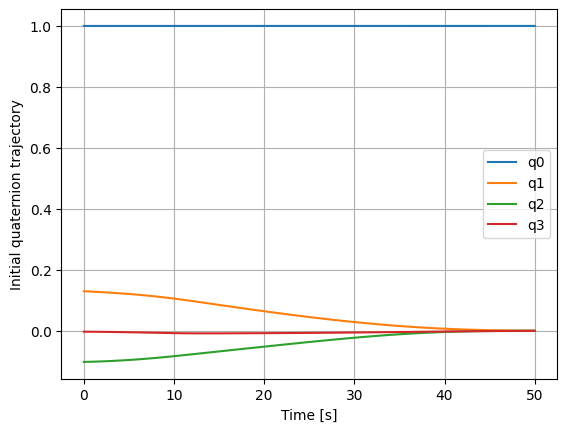

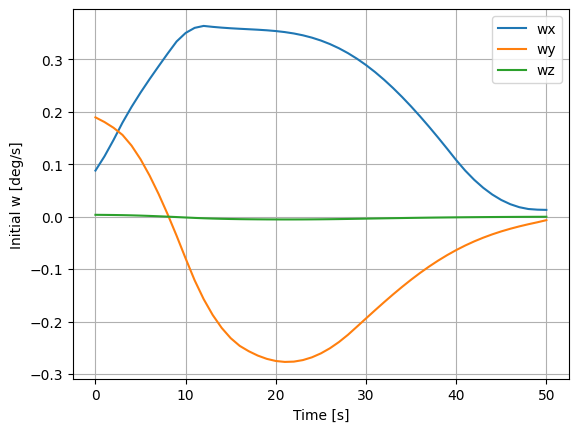

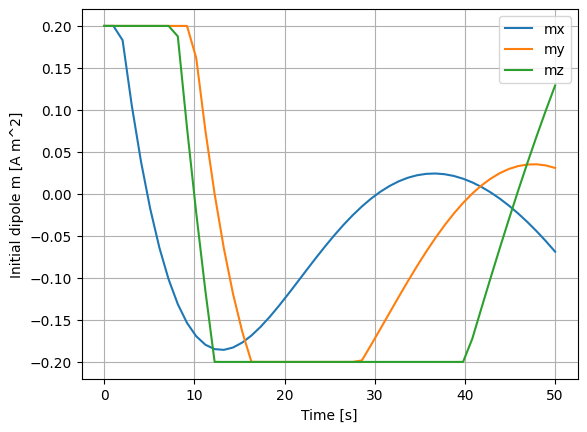

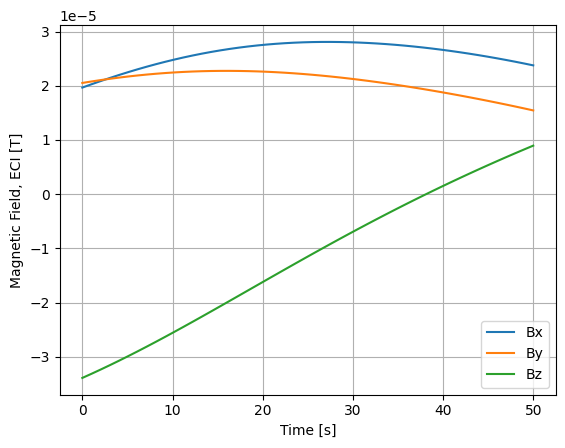

In [1391]:
t0_mpc = time.time()
hu_value,hx_value=m_MPC(init_quat,start_hb,0,tf_MPC,N_B_precomputed,mRMM_double,1000,1)
print("MPC time [ms]: ",(time.time()-t0_mpc)*1000)

for k in range(0,T_MPC+1):
    hx_value[3:6,k:k+1]=np.linalg.inv(Jsat_double)@hx_value[quaternion_size_MPC:quaternion_size_MPC+3,k:k+1]
plt.figure(1)
if quaternion_size_MPC==4:
    plt.plot(np.linspace(0, tf_MPC, T_MPC+1), hx_value[0,:], label='q0')
plt.plot(np.linspace(0, tf_MPC, T_MPC+1), hx_value[quaternion_size_MPC-3,:], label='q1')
plt.plot(np.linspace(0, tf_MPC, T_MPC+1), hx_value[quaternion_size_MPC-2,:], label='q2')
plt.plot(np.linspace(0, tf_MPC, T_MPC+1), hx_value[quaternion_size_MPC-1,:], label='q3')

plt.ylabel('Initial quaternion trajectory')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

plt.figure(2)
plt.plot(np.linspace(0, tf_MPC, T_MPC+1), hx_value[quaternion_size_MPC,:]*180/np.pi, label='wx')
plt.plot(np.linspace(0, tf_MPC, T_MPC+1), hx_value[quaternion_size_MPC+1,:]*180/np.pi, label='wy')
plt.plot(np.linspace(0, tf_MPC, T_MPC+1), hx_value[quaternion_size_MPC+2,:]*180/np.pi, label='wz')
plt.ylabel('Initial w [deg/s]')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

plt.figure(3)
plt.plot(np.linspace(0, tf_MPC, T_MPC), hu_value[0,:], label='mx')
plt.plot(np.linspace(0, tf_MPC, T_MPC), hu_value[1,:], label='my')
plt.plot(np.linspace(0, tf_MPC, T_MPC), hu_value[2,:], label='mz')
plt.ylabel('Initial dipole m [A m^2]')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

plt.figure(4)
plt.plot(np.linspace(0, tf_MPC, T_MPC), B_double_plot[0,:], label='Bx')
plt.plot(np.linspace(0, tf_MPC, T_MPC), B_double_plot[1,:], label='By')
plt.plot(np.linspace(0, tf_MPC, T_MPC), B_double_plot[2,:], label='Bz')
plt.ylabel('Magnetic Field, ECI [T]')
plt.xlabel('Time [s]')
plt.gca().tick_params(labelsize=10)
plt.legend()
plt.grid(True)

# COGU open loop + MPC closed loop

In [1]:
global MPC_control_count
MPC_control_count = 0
global u_value_MPC
u_value_MPC = np.zeros((3,T_MPC))
global MPC_first_flag
MPC_first_flag = 0

def add_quat_noise(q, sigma_rad=0*3*np.pi/180):
    """
    Add Gaussian noise to quaternion using small-angle perturbation.
    Represents CSS + magnetometer attitude estimation (~3 deg).
    """
    q = q.flatten()

    noise_vec = sigma_rad * np.random.randn(3)
    angle = np.linalg.norm(noise_vec)

    if angle > 1e-12:
        axis = noise_vec / angle
        dq = np.hstack([np.cos(angle/2), axis*np.sin(angle/2)])
    else:
        dq = np.array([1,0,0,0])

    # Quaternion multiplication dq ⊗ q
    qn = np.array([
        dq[0]*q[0] - dq[1]*q[1] - dq[2]*q[2] - dq[3]*q[3],
        dq[0]*q[1] + dq[1]*q[0] + dq[2]*q[3] - dq[3]*q[2],
        dq[0]*q[2] - dq[1]*q[3] + dq[2]*q[0] + dq[3]*q[1],
        dq[0]*q[3] + dq[1]*q[2] - dq[2]*q[1] + dq[3]*q[0]
    ])

    qn /= np.linalg.norm(qn)
    return qn.reshape(4,1)


def add_momentum_noise(h, sigma_omega_deg=0*0.02):
    """
    Add Gaussian noise to angular momentum corresponding to a constant 
    gyroscope noise sigma_omega_deg [deg/s].
    
    Parameters:
        h : np.array
            Angular momentum vector [kg·m²·rad/s]
        sigma_omega_deg : float
            Gyroscope noise standard deviation in deg/s
        J : float
            Moment of inertia per axis [kg·m²]
    """
    # Convert noise from deg/s to rad/s
    sigma_omega = sigma_omega_deg * np.pi / 180.0
    # Convert to absolute noise in angular momentum
    sigma_h = Jsat_double[0,0] * sigma_omega
    # Add Gaussian noise
    return h + sigma_h * np.random.randn(*h.shape)


# =========================================
# Control interpolation
# =========================================

def u_interpol_zoh(t, u_value, dt_control):
    """Zero-order hold interpolation"""
    T_control = u_value.shape[1]
    index = int(np.floor(t / dt_control))
    index = min(index, T_control - 1)
    return u_value[:, index]


def u_interpol_linear_MPC(t, u_value, dt_control, t_lat, quat, hb, sim_time, N_B_precomputed, MPC_control_size,alpha_q_double,alpha_h_double):
    """
    Linear interpolation with latency.
    """
    global MPC_control_count
    global u_value_MPC
    global MPC_first_flag
    
    T_control = u_value.shape[1]

    if t < t_lat:
        return np.zeros(3)

    t_rel = t - t_lat
    index = int(np.floor(t_rel / dt_control))
    if index <T_control-1:
        MPC_control_count = 0

        t0 = index * dt_control
        alpha = (t_rel - t0) / dt_control

        u0 = u_value[:, index]
        u1 = u_value[:, index + 1]
        return (1 - alpha) * u0 + alpha * u1
    else:
        if MPC_first_flag == 0:
            u_value_MPC, hx_value = m_MPC(quat, hb, t, sim_time,N_B_precomputed,mRMM_double,alpha_q_double,alpha_h_double)
            MPC_first_flag=1
            print(hx_value[0:quaternion_size_MPC,-1])

        # Recompute MPC every MPC_control_size steps
        if MPC_control_count == MPC_control_size:
            MPC_control_count = 0
            u_value_MPC, hx_value = m_MPC(quat, hb, t, sim_time,N_B_precomputed,mRMM_double,alpha_q_double,alpha_h_double)
            print(hx_value[0:quaternion_size_MPC,-1])
        return u_value_MPC[0:3, MPC_control_count]
    

# =========================================
# Attitude utilities
# =========================================

def quat_to_dcm(q):
    q0, q1, q2, q3 = q
    return np.array([
        [q0**2 + q1**2 - q2**2 - q3**2, 2*(q1*q2 + q0*q3), 2*(-q0*q2 + q1*q3)],
        [2*(q1*q2 - q0*q3), q0**2 - q1**2 + q2**2 - q3**2, 2*(q0*q1 + q2*q3)],
        [2*(q0*q2 + q1*q3), 2*(-q0*q1 + q2*q3), q0**2 - q1**2 - q2**2 + q3**2]
    ])


# =========================================
# Dynamics
# =========================================

def dynamics(t, x, u, params):

    q = x[0:4]
    w = x[4:7]
    m = u[0:3]

    I = params["I"]
    I_inv = params["I_inv"]
    N_B_precomputed = params["N_B_precomputed"]
    size_N_B_precomputed = params["size_N_B_precomputed"]
    tf = params["tf"]
    mRMM = params["mRMM"]

    BN = quat_to_dcm(q)
    N_B = ctvf.ECI_B_function(t, N_B_precomputed, size_N_B_precomputed, tf)

    torque = np.cross(m + mRMM[0:3,0], BN @ N_B[0:3,0])

    w_dot = I_inv @ (-np.cross(w, I @ w) + torque)

    wx, wy, wz = w
    q0, q1, q2, q3 = q

    q_dot = 0.5 * np.array([
        -wx*q1 - wy*q2 - wz*q3,
         wx*q0 + wz*q2 - wy*q3,
         wy*q0 - wz*q1 + wx*q3,
         wz*q0 + wy*q1 - wx*q2
    ])

    return np.concatenate((q_dot, w_dot))


# =========================================
# RK4 Integrator
# =========================================

def rk4_step(f, t, x, u, dt, params):

    k1 = f(t, x, u, params)
    k2 = f(t + dt/2, x + dt/2 * k1, u, params)
    k3 = f(t + dt/2, x + dt/2 * k2, u, params)
    k4 = f(t + dt, x + dt * k3, u, params)

    x_next = x + dt/6 * (k1 + 2*k2 + 2*k3 + k4)

    return x_next


# =========================================
# Simulation setup
# =========================================

inertia_error = 0*0.001
I = Jsat_double.copy()
I[0,0] += inertia_error
I[1,1] -= inertia_error
I[2,2] += inertia_error

sim_time = tf+300

N_B_precomputed = ctvf.precompute_B_wmm(
    v0_double, r0_double, JD_double, dt_wmm_double, sim_time
) * 1e-9

params = {
    "I": I,
    "I_inv": np.linalg.inv(I),
    "mRMM": mRMM_double,
    "tf": sim_time,
    "N_B_precomputed": N_B_precomputed,
    "size_N_B_precomputed": len(N_B_precomputed.T)
}

x = np.array([
    start_quat[0,0], start_quat[1,0], start_quat[2,0], start_quat[3,0],
    start_w_xyz[0,0], start_w_xyz[1,0], start_w_xyz[2,0]
])

dt_state = 1
dt_control = tau_double
N = int(sim_time / dt_state) + 1

alpha_q_double = 1000
alpha_h_double = 1

MPC_control_size = 2

q_history = np.zeros((N, 4))
w_history = np.zeros((N, 3))
t_history = np.zeros(N)
u_history = np.zeros((N, 3))
N_B_history = np.zeros((N, 3))

t = 0
t_lat = 0 #COGU latency

# =========================================
# Simulation loop
# =========================================

for i in range(N):

    q_history[i] = x[0:4]
    w_history[i] = x[4:7]
    t_history[i] = t

    # Add measurement noise
    q_meas = add_quat_noise(x[0:4].reshape(4,1))
    h_true = Jsat_double @ x[4:7].reshape(3,1)
    h_meas = add_momentum_noise(h_true)
    h_meas = np.copy(h_true)
    if i % int(dt_MPC / dt_state) == 0:
        MPC_control_count += 1

    q_meas[0]=1

    u_current  = u_interpol_linear_MPC(
        t, u_value, dt_control, t_lat,
        q_meas[4-quaternion_size_MPC:4], h_meas, sim_time, N_B_precomputed,
        MPC_control_size, alpha_q_double, alpha_h_double)

    u_history[i] = u_current

    N_B_history[i] = ctvf.ECI_B_function(t, N_B_precomputed, len(N_B_precomputed.T), sim_time).T

    x = rk4_step(dynamics, t, x, u_current, dt_state, params)
    
    t += dt_state

    print("Time [s]: ",t)
    print(MPC_control_count)
# =========================================
# Plots
# =========================================

plt.figure()
plt.plot(t_history, q_history)
plt.plot(t_history, np.linalg.norm(q_history, axis=1))
plt.legend(["q0","q1","q2","q3","|q|"])
plt.title("Quaternion Evolution")
plt.grid()
plt.show()

plt.figure()
plt.plot(t_history, w_history * 180/np.pi)
plt.plot(t_history, np.linalg.norm(w_history, axis=1) * 180/np.pi)
plt.legend(["wx","wy","wz","|w|"])
plt.title("Angular Velocity [deg/s]")
plt.grid()
plt.show()


# Pointing error
plt.figure()

rot_RN = R.from_quat(end_quat.T)
RN = rot_RN.as_matrix()

point_error = np.zeros(N)

for i in range(N):
    BN = R.from_quat(q_history[i]).as_matrix()
    BR = BN @ RN.T

    val = np.clip(BR[2,2], -1.0, 1.0)
    point_error[i] = math.acos(val)

plt.plot(t_history, point_error * 180/np.pi)
plt.title("Pointing Error [deg]")
plt.grid()
plt.show()

plt.figure()
plt.plot(t_history, u_history)
plt.legend(["mx","my","mz"])
plt.title("Magnetic Dipole Control")
plt.grid()
plt.show()

plt.figure()
plt.plot(t_history, N_B_history)
plt.legend(["Bx","By","Bz"])
plt.title("Magnetic Field (WMM+HPOP) ECI")
plt.grid()
plt.show()

NameError: name 'np' is not defined

In [1061]:
mRMM_double

array([[ 0.03],
       [-0.02],
       [ 0.05]])

# Detumbling

In [13]:
dt_state = 0.05

0.05
0.1
0.15000000000000002
0.2
0.25
0.3
0.35
0.39999999999999997
0.44999999999999996
0.49999999999999994
0.5499999999999999
0.6
0.65
0.7000000000000001
0.7500000000000001
0.8000000000000002
0.8500000000000002
0.9000000000000002
0.9500000000000003
1.0000000000000002
1.0500000000000003
1.1000000000000003
1.1500000000000004
1.2000000000000004
1.2500000000000004
1.3000000000000005
1.3500000000000005
1.4000000000000006
1.4500000000000006
1.5000000000000007
1.5500000000000007
1.6000000000000008
1.6500000000000008
1.7000000000000008
1.7500000000000009
1.800000000000001
1.850000000000001
1.900000000000001
1.950000000000001
2.000000000000001
2.0500000000000007
2.1000000000000005
2.1500000000000004
2.2
2.25
2.3
2.3499999999999996
2.3999999999999995
2.4499999999999993
2.499999999999999
2.549999999999999
2.5999999999999988
2.6499999999999986
2.6999999999999984
2.7499999999999982
2.799999999999998
2.849999999999998
2.8999999999999977
2.9499999999999975
2.9999999999999973
3.049999999999997
3.09999

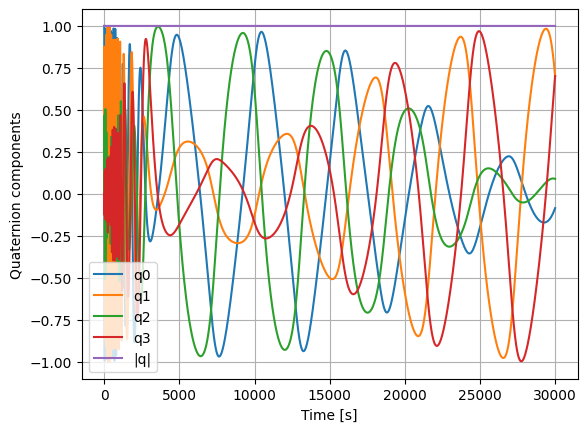

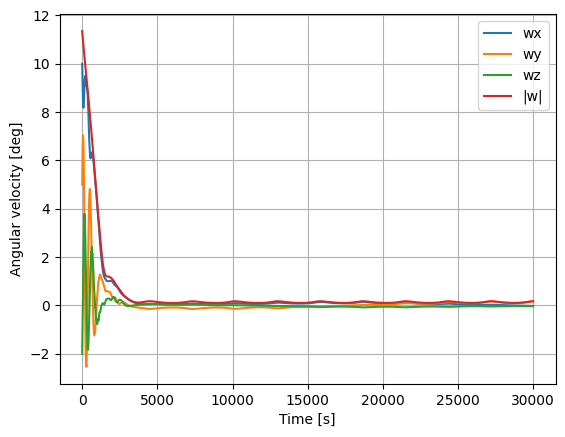

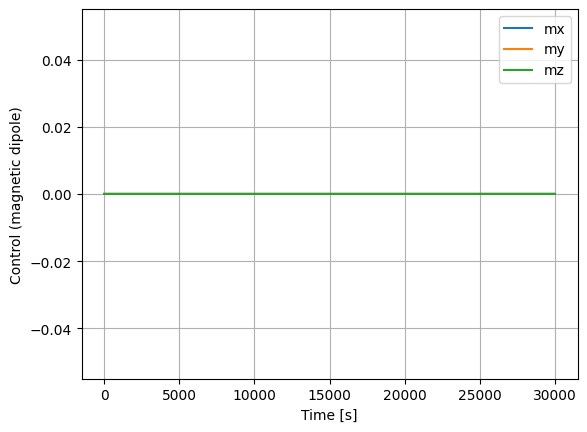

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import math
def u_interpol_zoh(t, u_value, dt_control):
    """
    Zero-order hold interpolation
    u_value: shape (3, T_control)
    dt_control: paso de discretización del control
    """

    T_control = u_value.shape[1]

    index = int(np.floor(t / dt_control))

    if index >= T_control:
        index = T_control - 1

    return u_value[:, index]

def u_interpol_linear(t, u_value, dt_control):
    """
    Linear interpolation of control input

    Parameters
    ----------
    t : float
        Current simulation time
    u_value : ndarray shape (3, T_control)
        Discrete control samples
    dt_control : float
        Control sampling time

    Returns
    -------
    u_interp : ndarray shape (3,)
        Interpolated control vector at time t
    """

    T_control = u_value.shape[1]

    # Índice inferior
    index = int(np.floor(t / dt_control))

    # Si estamos fuera del rango → mantener último valor
    if index >= T_control - 1:
        return u_value[:, -1]

    # Tiempo local dentro del intervalo
    t0 = index * dt_control
    alpha = (t - t0) / dt_control  # 0 ≤ alpha < 1

    # Interpolación lineal
    u0 = u_value[:, index]
    u1 = u_value[:, index + 1]

    return (1 - alpha) * u0 + alpha * u1

def quat_to_dcm(q):
    q0, q1, q2, q3 = q
    return np.array([
        [q0**2 + q1**2 - q2**2 - q3**2, 2*(q1*q2 + q0*q3), 2*(-q0*q2 + q1*q3)],
        [2*(q1*q2 - q0*q3), q0**2 - q1**2 + q2**2 - q3**2, 2*(q0*q1 + q2*q3)],
        [2*(q0*q2 + q1*q3), 2*(-q0*q1 + q2*q3), q0**2 - q1**2 - q2**2 + q3**2]
    ])

def dcm_ZXZ(Omega, inc, theta):
    cO = np.cos(Omega)
    sO = np.sin(Omega)
    ci = np.cos(inc)
    si = np.sin(inc)
    ct = np.cos(theta)
    st = np.sin(theta)

    Rz1 = np.array([[cO, -sO, 0],
                    [sO,  cO, 0],
                    [0,   0,  1]])

    Rx  = np.array([[1, 0, 0],
                    [0, ci, -si],
                    [0, si,  ci]])

    Rz2 = np.array([[ct, -st, 0],
                    [st,  ct, 0],
                    [0,   0,  1]])

    return (Rz1 @ Rx @ Rz2).T


# =============================
# Dinámica
# =============================
global B_prev
B_prev = np.zeros(3)

def dynamics(t, x, u, params):
    global B_prev

    q = x[0:4]
    w = x[4:7]
    m = u

    I = params["I"]
    I_inv = params["I_inv"]
    n = params["n"]
    Omega = params["Omega"]
    inc = params["inc"]
    B0 = params["B0"]
    t0_double = params["t0"]

    O_B = np.array([
        -2*np.sin(inc)*np.cos(n*(t+t0_double)),
        -np.sin(inc)*np.sin(n*(t+t0_double)),
         np.cos(inc)
    ]) * B0

    BN = quat_to_dcm(q)
    ON = dcm_ZXZ(Omega, inc, n*(t+t0_double))
    BO = BN @ ON.T
    B_B= BO @ O_B
    torque = np.cross(-0.0000243*(B_B-B_prev)/dt_state/(np.linalg.norm(B_B)**2), BO @ O_B)
    B_prev=np.copy(B_B)
    w_dot = I_inv @ (-np.cross(w, I @ w) + torque)

    q0, q1, q2, q3 = q
    wx, wy, wz = w

    q_dot = 0.5 * np.array([
        -wx*q1 - wy*q2 - wz*q3,
         wx*q0 + wz*q2 - wy*q3,
         wy*q0 - wz*q1 + wx*q3,
         wz*q0 + wy*q1 - wx*q2
    ])

    return np.concatenate((q_dot, w_dot))


# =============================
# RK4
# =============================

def rk4_step(f, t, x, u, dt, params):

    k1 = f(t, x, u, params)
    k2 = f(t + dt/2, x + dt/2 * k1, u, params)
    k3 = f(t + dt/2, x + dt/2 * k2, u, params)
    k4 = f(t + dt, x + dt * k3, u, params)

    x_next = x + dt/6 * (k1 + 2*k2 + 2*k3 + k4)

    # Normalizar cuaternión
    #x_next[0:4] /= np.linalg.norm(x_next[0:4])

    return x_next


# =============================
# Simulación
# =============================

t0_double = 0
Jsat_double = np.array([[0.0022,0.00002,0.00002],[0.00002,0.0021,0.00002],[0.00002,0.00002,0.0019]]) #Kg m^2
mu_earth = 3.986004418e14        # [m^3/s^2] Earth gravitational parameter
R_E = 6378e3               # [m] Earth radius
h_cubesat = 500e3                  # [m] altitude
mu0_over_4pi = 1e-7       # magnetic constant factor
m_E = 7.94e22             # [A·m^2] Earth magnetic dipole moment
a_cubesat = R_E + h_cubesat

n_cubesat_double = np.sqrt(mu_earth / a_cubesat**3)    # rad/s
Omega_double = 45*math.pi/180 # Right ascending node
inc_double = 97.6*math.pi/180 # Satellite inclination SSO
B0_double = mu0_over_4pi * m_E / a_cubesat**3   # Tesla

inertia_error = 0.00000 
I = np.copy(Jsat_double)

mu_earth = 3.986004418e14        # [m^3/s^2] Earth gravitational parameter
n_cubesat_double = np.sqrt(mu_earth / a_cubesat**3)    # rad/s

params = {
    "I": I,
    "I_inv": np.linalg.inv(I),
    "n": n_cubesat_double,
    "Omega": 0,
    "inc": 97*np.pi/180,
    "B0": B0_double,
    "t0": t0_double
}

x = np.array([1, 0, 0, 0, 10*np.pi/180, 5*np.pi/180, -2*np.pi/180])

dt_state = 0.05 # step RK4 (closed loop)
tf = 30000
N = int(tf/dt_state)+1

q_history = np.zeros((N, 4))
w_history = np.zeros((N, 3))
t_history = np.zeros(N)
u_history = np.zeros((N, 3))
t=0

for i in range(N):
    q_history[i] = x[0:4]
    w_history[i] = x[4:7]
    t_history[i] = t

    #u_current = u_interpol_zoh(t, u_value, dt_control)
    u_current = np.zeros(3)
    
    u_history[i] = u_current   # <-- guardar control

    x = rk4_step(dynamics, t, x, u_current, dt_state, params)
    t += dt_state

    print(t)
# =============================
# Plot quaternion
# =============================

plt.figure(1)
plt.plot(t_history, q_history[:, 0])
plt.plot(t_history, q_history[:, 1])
plt.plot(t_history, q_history[:, 2])
plt.plot(t_history, q_history[:, 3])
plt.plot(t_history, np.linalg.norm(q_history,ord=2,axis=1))
plt.xlabel("Time [s]")
plt.ylabel("Quaternion components")
plt.legend(["q0", "q1", "q2", "q3", "|q|"])
plt.grid(True)
plt.show()

# =============================
# Plot angular velocity
# =============================

plt.figure(1)
plt.plot(t_history, w_history[:, 0]*180/np.pi)
plt.plot(t_history, w_history[:, 1]*180/np.pi)
plt.plot(t_history, w_history[:, 2]*180/np.pi)
plt.plot(t_history, np.linalg.norm(w_history,ord=2,axis=1)*180/np.pi)
plt.xlabel("Time [s]")
plt.ylabel("Angular velocity [deg]")
plt.legend(["wx", "wy", "wz", "|w|"])
plt.grid(True)
plt.show()

# --- Pointing error ---
plt.figure(2)

plt.step(t_history, u_history[:, 0])
plt.step(t_history, u_history[:, 1])
plt.step(t_history, u_history[:, 2])
plt.xlabel("Time [s]")
plt.ylabel("Control (magnetic dipole)")
plt.legend(["mx", "my", "mz"])
plt.grid(True)
plt.show()